# 🌅Customer Segmentation Hutsutori



# ☕ Coffee drinker

## 🎯Import Libraries

In [ ]:
!pip install ydata-profiling
!pip install autoviz
!pip install sweetviz

In [ ]:
import numpy as np
import pandas as pd
import sys
from google.colab import files

#Data visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
import missingno as msno

#Auto report
from ydata_profiling import ProfileReport
import sweetviz as sv
from autoviz.AutoViz_Class import AutoViz_Class

# scikit-learn
from sklearn import cluster,metrics



Imported v0.1.806. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [ ]:
print ("Pandas version",pd.__version__)
print ("python version",sys.version)
print ("Matplotlib version",mpl.__version__)

Pandas version 1.5.3
python version 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
Matplotlib version 3.7.1


In [ ]:
!wget -q http://github.com/Phonbopit/sarabun-webfont/raw/master/fonts/thsarabunnew-webfont.ttf

In [ ]:
mpl.font_manager.fontManager.addfont('thsarabunnew-webfont.ttf')
mpl.rc('font',family='TH Sarabun New', size=16)

## 🎯Import data

In [ ]:
coffee_drinker_data = pd.read_csv("/content/Coffee_drinker_clean.csv")

In [ ]:
coffee_drinker_data.head()

,Gender,Age,Occupation,Coffee_type,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee,How_you_drink,Suitable_price_range,Time_drink_coffee,Home_drink,Cups_coffee_taken,Why_no_coffee,Where_having_coffee,First_priority,Second,Third_priority,Fourth_priority,Captital_coffee,interest_jp_coffee,Yes_reason,No_reason,Monthly_income
0,Male,50~59,พนักงานบริษัท,Hot,3.0,5.0,1.0,4.0,ไม่ใส่อะไรเพิ่ม,50~100บาท,เวลาทำงาน,กาแฟ,มากกว่านั้น,NaN,ที่ทำงาน,รสชาติ,สถานทีผลิต,ความง่ายในการชง,ราคาถูก,100~120บาท,ไม่,NaN,เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,49000~
1,Female,20~29,นักเรียน/นักศึกษา,Cold,5.0,2.0,1.0,4.0,ใส่เครื่องดื่มรสหวานๆเพิ่ม,50~100บาท,ทานกับขนมหวาน,น้ำผลไม้,0,ไม่มีเหตุผลที่จะซื้อ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,~15000 บาท
2,Female,20~29,นักเรียน/นักศึกษา,Cold,4.0,2.0,1.0,4.0,ใส่นมเพิ่ม,100~150บาท,เวลาทำงาน,ชา,1~2,NaN,ที่ทำงาน,รสชาติ,ราคาถูก,สถานทีผลิต,ความง่ายในการชง,140~160บาท,ไม่,NaN,NaN,~15000 บาท
3,Male,20~29,พนักงานบริษัท,Cold,4.0,3.0,4.0,5.0,ใส่น้ำตาลหรือน้ำเชื่อมเพิ่ม,50~100บาท,"หลังจากตื่นนอน, ก่อนเข้านอน",ชา,1~2,NaN,"บ้าน, คาเฟ่, แผงลอยข้างถนน, ที่ทำงาน",ราคาถูก,รสชาติ,สถานทีผลิต,ความง่ายในการชง,40~60บาท,ไม่,NaN,เพราะราคาดูแพงเกินไป,21000~23000
4,Male,20~29,นักเรียน/นักศึกษา,Both,4.0,3.0,2.0,5.0,ใส่นมเพิ่ม,100~150บาท,"เวลาทำงาน, ทานกับขนมหวาน","กาแฟ, ชา, น้ำผลไม้, เครื่องดื่มแอลกอฮอล์",1~2,NaN,"บ้าน, คาเฟ่, ที่ทำงาน",รสชาติ,สถานทีผลิต,ราคาถูก,ความง่ายในการชง,120~140บาท,ใช่,"เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง, เพราะชอบภาพลักษณ์ญี่ปุ่นในผลิตภัณฑ์",NaN,~15000 บาท


In [ ]:
coffee_drinker_data.shape

(316, 24)

In [ ]:
coffee_drinker_data.columns.to_list()

['Gender',
 'Age',
 'Occupation',
 'Coffee_type',
 'Chance_and_coffee_trend',
 'level_of_roasted',
 'Level_of_acidity',
 'Smell_of_coffee',
 'How_you_drink',
 'Suitable_price_range',
 'Time_drink_coffee',
 'Home_drink',
 'Cups_coffee_taken',
 'Why_no_coffee',
 'Where_having_coffee',
 'First_priority',
 'Second',
 'Third_priority',
 'Fourth_priority',
 'Captital_coffee',
 'interest_jp_coffee',
 'Yes_reason',
 'No_reason',
 'Monthly_income']

In [ ]:
profile = ProfileReport(coffee_drinker_data,title='EDA')

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
analyze_report = sv.analyze(coffee_drinker_data)
analyze_report.show_html('coffee_drinker_report.html', open_browser=False)


                                             |          | [  0%]   00:00 -> (? left)

Report coffee_drinker_report.html was generated.


In [ ]:
files.download('coffee_drinker_report.html')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Shape of your Data Set loaded: (316, 24)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  4
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  18
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  2
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    24 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix these data quality issues in the dataset, import FixDQ from autoviz...
    All variabl

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Gender,object,1.898734,0,,,"6 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"
Age,object,1.898734,1,,,"6 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['10~19']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Occupation,object,0.000000,1,,,No issue
Coffee_type,object,0.949367,0,,,"3 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"
Chance_and_coffee_trend,float64,0.632911,NA,1.000000,5.000000,"2 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 11 outliers greater than upper bound (6.50) or lower than lower bound(2.50). Cap them or remove them."
level_of_roasted,float64,0.949367,NA,1.000000,5.000000,"3 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 20 outliers greater than upper bound (5.50) or lower than lower bound(1.50). Cap them or remove them."
Level_of_acidity,float64,0.316456,NA,1.000000,5.000000,"1 missing values. Impute them with mean, median, mode, or a constant value such as 123."
Smell_of_coffee,float64,0.632911,NA,1.000000,5.000000,"2 missing values. Impute them with mean, median, mode, or a constant value such as 123."
How_you_drink,object,1.898734,4,,,"6 missing values. Impute them with mean, median, mode, or a constant value such as 123., 11 rare categories: Too many to list. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Suitable_price_range,object,0.949367,2,,,"3 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"


Number of All Scatter Plots = 10


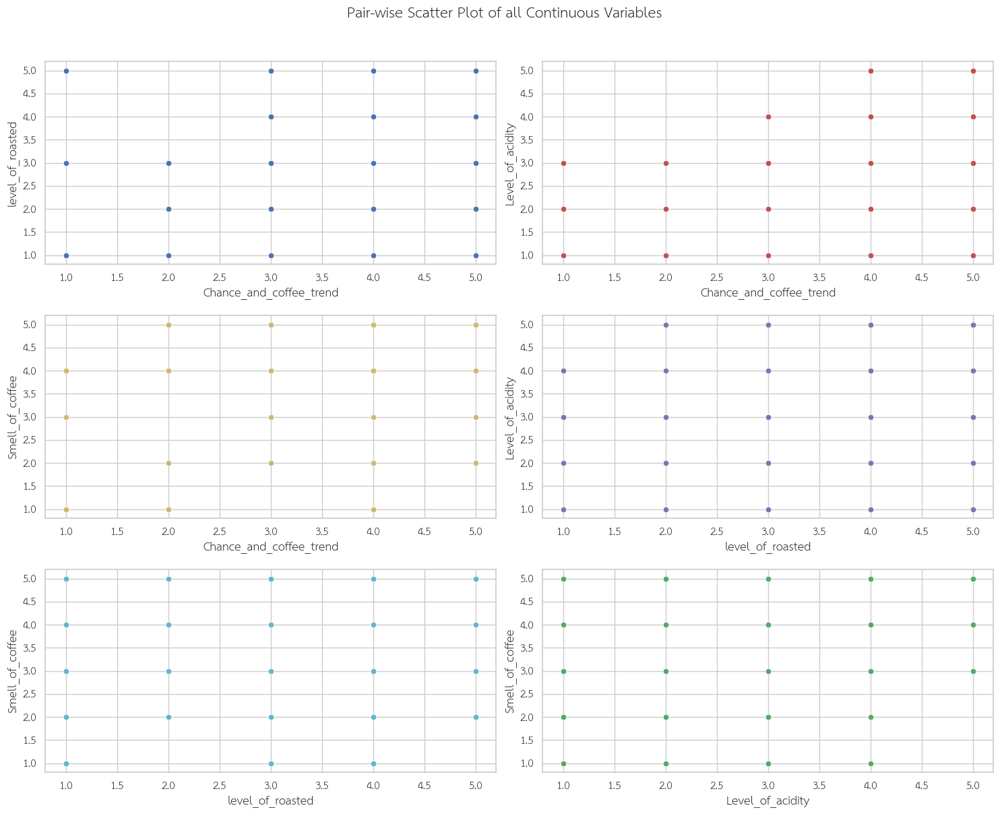

Could not draw Distribution Plot


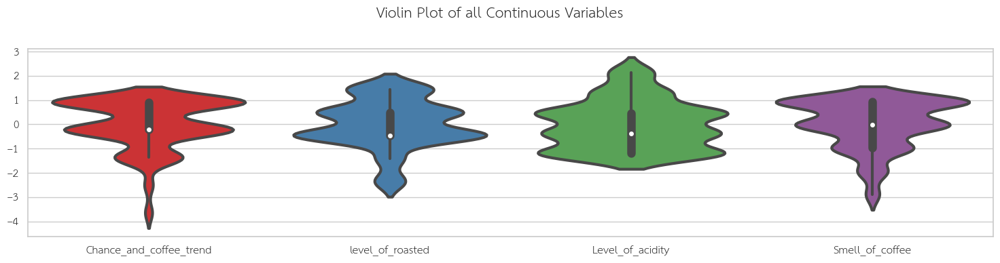

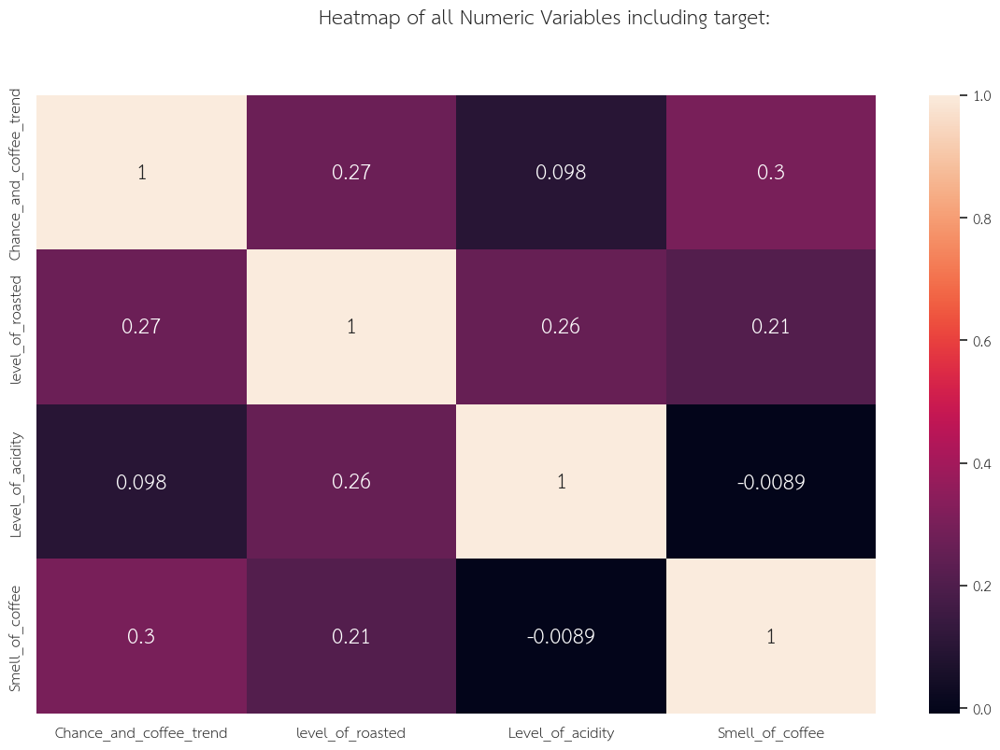

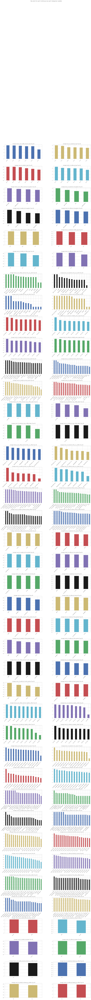

All Plots done
Time to run AutoViz = 29 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
AV = AutoViz_Class()
%matplotlib inline
dfte = AV.AutoViz('/content/Coffee_drinker_clean.csv', sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=500,max_cols_analyzed=30, save_plot_dir=None)

Our data is non normal and contain outliers


## Data preprocessing

In [ ]:
coffee_drinker_data.head(2)

,Gender,Age,Occupation,Coffee_type,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee,How_you_drink,Suitable_price_range,Time_drink_coffee,Home_drink,Cups_coffee_taken,Why_no_coffee,Where_having_coffee,First_priority,Second,Third_priority,Fourth_priority,Captital_coffee,interest_jp_coffee,Yes_reason,No_reason,Monthly_income
0,Male,50~59,พนักงานบริษัท,Hot,3.0,5.0,1.0,4.0,ไม่ใส่อะไรเพิ่ม,50~100บาท,เวลาทำงาน,กาแฟ,มากกว่านั้น,NaN,ที่ทำงาน,รสชาติ,สถานทีผลิต,ความง่ายในการชง,ราคาถูก,100~120บาท,ไม่,NaN,เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,49000~
1,Female,20~29,นักเรียน/นักศึกษา,Cold,5.0,2.0,1.0,4.0,ใส่เครื่องดื่มรสหวานๆเพิ่ม,50~100บาท,ทานกับขนมหวาน,น้ำผลไม้,0,ไม่มีเหตุผลที่จะซื้อ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,~15000 บาท


### Check the duplicate of data

In [ ]:
coffee_drinker_data.duplicated().sum()

0

### Check the missing value of data

In [ ]:
coffee_drinker_data.isna().sum()

Gender                       6
Age                          6
Occupation                   0
Coffee_type                  3
Chance_and_coffee_trend      2
level_of_roasted             3
Level_of_acidity             1
Smell_of_coffee              2
How_you_drink                6
Suitable_price_range         3
Time_drink_coffee            0
Home_drink                   0
Cups_coffee_taken            1
Why_no_coffee              219
Where_having_coffee         22
First_priority              30
Second                      59
Third_priority              66
Fourth_priority             72
Captital_coffee             21
interest_jp_coffee          23
Yes_reason                  63
No_reason                  189
Monthly_income              10
dtype: int64

In [ ]:
coffee_drinker_data.dtypes

Gender                      object
Age                         object
Occupation                  object
Coffee_type                 object
Chance_and_coffee_trend    float64
level_of_roasted           float64
Level_of_acidity           float64
Smell_of_coffee            float64
How_you_drink               object
Suitable_price_range        object
Time_drink_coffee           object
Home_drink                  object
Cups_coffee_taken           object
Why_no_coffee               object
Where_having_coffee         object
First_priority              object
Second                      object
Third_priority              object
Fourth_priority             object
Captital_coffee             object
interest_jp_coffee          object
Yes_reason                  object
No_reason                   object
Monthly_income              object
dtype: object

In [ ]:
numeric_col_list = ['Chance_and_coffee_trend',
 'level_of_roasted',
 'Level_of_acidity',
 'Smell_of_coffee']

for col in numeric_col_list:
  coffee_drinker_data[col].fillna(coffee_drinker_data[col].median(), inplace=True)

categorical_col_list = ['Gender',
 'Age',
 'Occupation',
 'Coffee_type',
 'How_you_drink',
 'Suitable_price_range',
 'Time_drink_coffee',
 'Home_drink',
 'Cups_coffee_taken',
 'Why_no_coffee',
 'Where_having_coffee',
 'First_priority',
 'Second',
 'Third_priority',
 'Fourth_priority',
 'Captital_coffee',
 'interest_jp_coffee',
 'Yes_reason',
 'No_reason',
 'Monthly_income']

for col in categorical_col_list:
  mode_value = coffee_drinker_data[col].mode().iloc[0]
  coffee_drinker_data[col].fillna(mode_value, inplace=True)


reason_col_list = ['Yes_reason','No_reason','Why_no_coffee']
for col in reason_col_list:
  coffee_drinker_data[col].fillna('None', inplace=True)


In [ ]:
coffee_drinker_data.head(2)

,Gender,Age,Occupation,Coffee_type,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee,How_you_drink,Suitable_price_range,Time_drink_coffee,Home_drink,Cups_coffee_taken,Why_no_coffee,Where_having_coffee,First_priority,Second,Third_priority,Fourth_priority,Captital_coffee,interest_jp_coffee,Yes_reason,No_reason,Monthly_income
0,Male,50~59,พนักงานบริษัท,Hot,3.0,5.0,1.0,4.0,ไม่ใส่อะไรเพิ่ม,50~100บาท,เวลาทำงาน,กาแฟ,มากกว่านั้น,วิธีการทำยุ่งยาก เหนื่อยล้าที่จะทำ,ที่ทำงาน,รสชาติ,สถานทีผลิต,ความง่ายในการชง,ราคาถูก,100~120บาท,ไม่,เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง,เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,49000~
1,Female,20~29,นักเรียน/นักศึกษา,Cold,5.0,2.0,1.0,4.0,ใส่เครื่องดื่มรสหวานๆเพิ่ม,50~100บาท,ทานกับขนมหวาน,น้ำผลไม้,0,ไม่มีเหตุผลที่จะซื้อ,ที่ทำงาน,รสชาติ,ราคาถูก,ความง่ายในการชง,สถานทีผลิต,40~60บาท,ใช่,เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง,เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,~15000 บาท


In [ ]:
coffee_drinker_data.isna().sum()

Gender                     0
Age                        0
Occupation                 0
Coffee_type                0
Chance_and_coffee_trend    0
level_of_roasted           0
Level_of_acidity           0
Smell_of_coffee            0
How_you_drink              0
Suitable_price_range       0
Time_drink_coffee          0
Home_drink                 0
Cups_coffee_taken          0
Why_no_coffee              0
Where_having_coffee        0
First_priority             0
Second                     0
Third_priority             0
Fourth_priority            0
Captital_coffee            0
interest_jp_coffee         0
Yes_reason                 0
No_reason                  0
Monthly_income             0
dtype: int64

No missing value


### ⭐sub the data

In [ ]:
col_list_seg = ['Chance_and_coffee_trend',
 'level_of_roasted',
 'Level_of_acidity',
 'Smell_of_coffee']

sub_coffee_drinker_data = coffee_drinker_data[col_list_seg]

In [ ]:
sub_coffee_drinker_data.describe()

,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee
count,316.000000,316.000000,316.000000,316.000000
mean,4.193038,3.468354,2.439873,4.025316
std,0.875096,1.049087,1.197693,1.044711
min,1.000000,1.000000,1.000000,1.000000
25%,4.000000,3.000000,1.000000,3.000000
50%,4.000000,3.000000,2.000000,4.000000
75%,5.000000,4.000000,3.000000,5.000000
max,5.000000,5.000000,5.000000,5.000000


## Choose 4 features

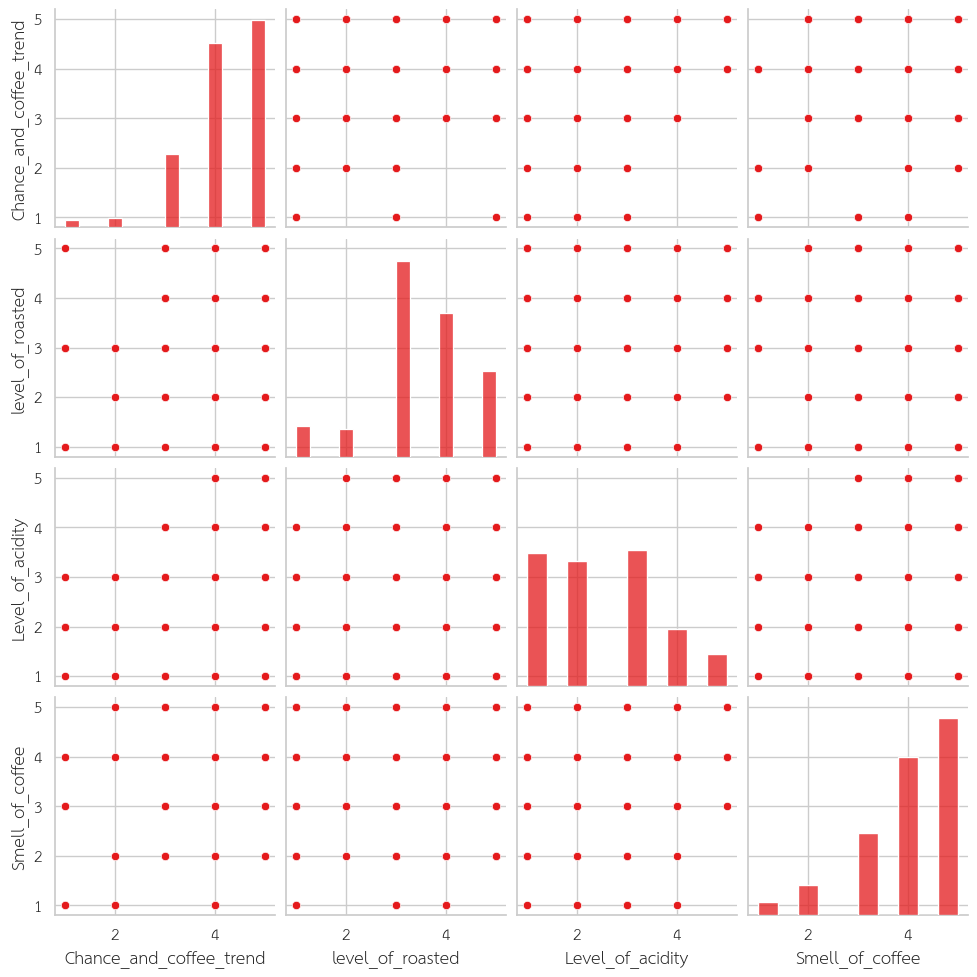

In [ ]:
sns.pairplot(sub_coffee_drinker_data)

### the 4 feature
1. 'Chance_and_coffee_trend'
2. 'level_of_roasted'
3. 'Level_of_acidity'
4. 'Smell_of_coffee'


## 🎯K- mean clustering

In [ ]:
coffee_drinker_data.columns.tolist()

['Gender',
 'Age',
 'Occupation',
 'Coffee_type',
 'Chance_and_coffee_trend',
 'level_of_roasted',
 'Level_of_acidity',
 'Smell_of_coffee',
 'How_you_drink',
 'Suitable_price_range',
 'Time_drink_coffee',
 'Home_drink',
 'Cups_coffee_taken',
 'Why_no_coffee',
 'Where_having_coffee',
 'First_priority',
 'Second',
 'Third_priority',
 'Fourth_priority',
 'Captital_coffee',
 'interest_jp_coffee',
 'Yes_reason',
 'No_reason',
 'Monthly_income']

In [ ]:
data_for_cluster = sub_coffee_drinker_data
eval_data_to_concat_cluster = coffee_drinker_data[['Gender',
 'Age',
 'Occupation',
 'Coffee_type',
 'Chance_and_coffee_trend',
 'level_of_roasted',
 'Level_of_acidity',
 'Smell_of_coffee',
 'How_you_drink',
 'Suitable_price_range',
 'Time_drink_coffee',
 'Home_drink',
 'Cups_coffee_taken',
 'Why_no_coffee',
 'Where_having_coffee',
 'First_priority',
 'Second',
 'Third_priority',
 'Fourth_priority',
 'Captital_coffee',
 'interest_jp_coffee',
 'Yes_reason',
 'No_reason',
 'Monthly_income']]

In [ ]:
# data_for_cluster.head(5)
eval_data_to_concat_cluster.head(5)

,Gender,Age,Occupation,Coffee_type,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee,How_you_drink,Suitable_price_range,Time_drink_coffee,Home_drink,Cups_coffee_taken,Why_no_coffee,Where_having_coffee,First_priority,Second,Third_priority,Fourth_priority,Captital_coffee,interest_jp_coffee,Yes_reason,No_reason,Monthly_income
0,Male,50~59,พนักงานบริษัท,Hot,3.0,5.0,1.0,4.0,ไม่ใส่อะไรเพิ่ม,50~100บาท,เวลาทำงาน,กาแฟ,มากกว่านั้น,วิธีการทำยุ่งยาก เหนื่อยล้าที่จะทำ,ที่ทำงาน,รสชาติ,สถานทีผลิต,ความง่ายในการชง,ราคาถูก,100~120บาท,ไม่,เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง,เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,49000~
1,Female,20~29,นักเรียน/นักศึกษา,Cold,5.0,2.0,1.0,4.0,ใส่เครื่องดื่มรสหวานๆเพิ่ม,50~100บาท,ทานกับขนมหวาน,น้ำผลไม้,0,ไม่มีเหตุผลที่จะซื้อ,ที่ทำงาน,รสชาติ,ราคาถูก,ความง่ายในการชง,สถานทีผลิต,40~60บาท,ใช่,เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง,เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,~15000 บาท
2,Female,20~29,นักเรียน/นักศึกษา,Cold,4.0,2.0,1.0,4.0,ใส่นมเพิ่ม,100~150บาท,เวลาทำงาน,ชา,1~2,วิธีการทำยุ่งยาก เหนื่อยล้าที่จะทำ,ที่ทำงาน,รสชาติ,ราคาถูก,สถานทีผลิต,ความง่ายในการชง,140~160บาท,ไม่,เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง,เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,~15000 บาท
3,Male,20~29,พนักงานบริษัท,Cold,4.0,3.0,4.0,5.0,ใส่น้ำตาลหรือน้ำเชื่อมเพิ่ม,50~100บาท,"หลังจากตื่นนอน, ก่อนเข้านอน",ชา,1~2,วิธีการทำยุ่งยาก เหนื่อยล้าที่จะทำ,"บ้าน, คาเฟ่, แผงลอยข้างถนน, ที่ทำงาน",ราคาถูก,รสชาติ,สถานทีผลิต,ความง่ายในการชง,40~60บาท,ไม่,เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง,เพราะราคาดูแพงเกินไป,21000~23000
4,Male,20~29,นักเรียน/นักศึกษา,Both,4.0,3.0,2.0,5.0,ใส่นมเพิ่ม,100~150บาท,"เวลาทำงาน, ทานกับขนมหวาน","กาแฟ, ชา, น้ำผลไม้, เครื่องดื่มแอลกอฮอล์",1~2,วิธีการทำยุ่งยาก เหนื่อยล้าที่จะทำ,"บ้าน, คาเฟ่, ที่ทำงาน",รสชาติ,สถานทีผลิต,ราคาถูก,ความง่ายในการชง,120~140บาท,ใช่,"เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง, เพราะชอบภาพลักษณ์ญี่ปุ่นในผลิตภัณฑ์",เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,~15000 บาท


### Scaling data before performing clustering


In [ ]:
scale_data_for_cluster = (data_for_cluster-data_for_cluster.mean())/data_for_cluster.std()
scale_data_for_cluster.head()

,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee
0,-1.363323,1.45998,-1.202206,-0.024233
1,0.922141,-1.39965,-1.202206,-0.024233
2,-0.220591,-1.39965,-1.202206,-0.024233
3,-0.220591,-0.44644,1.302610,0.932970
4,-0.220591,-0.44644,-0.367267,0.932970


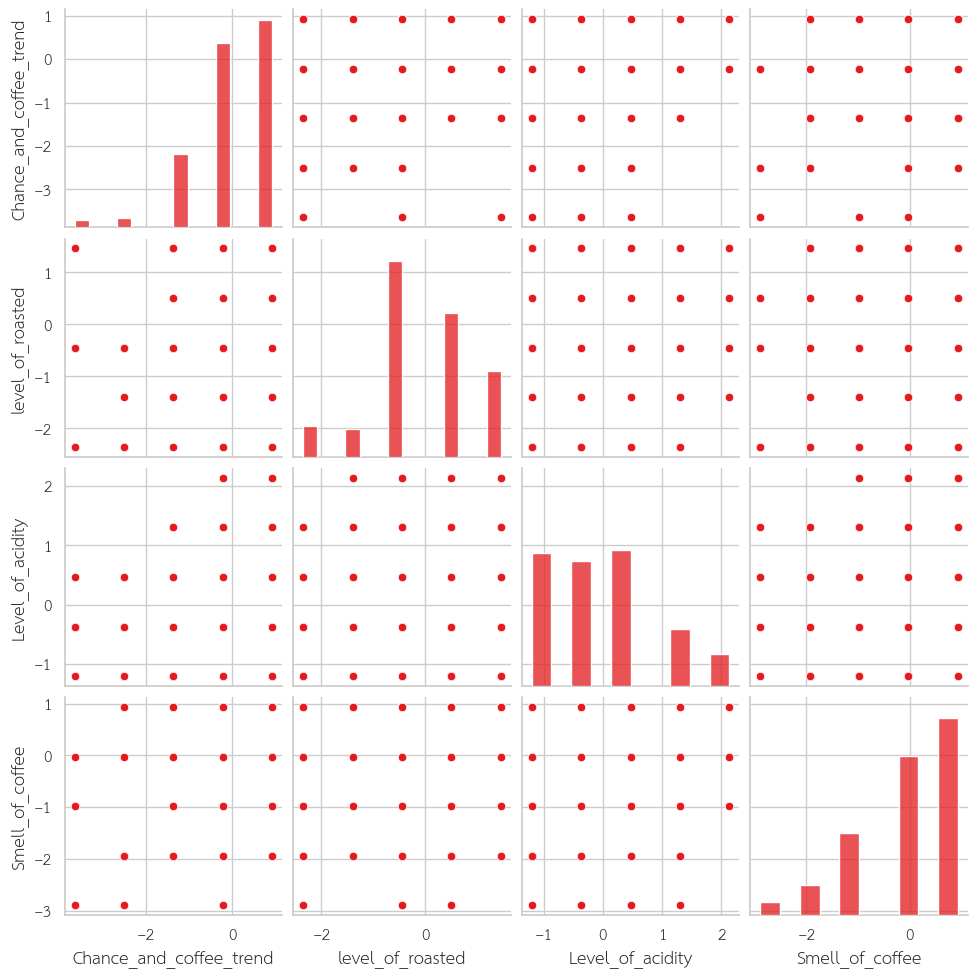

In [ ]:
sns.pairplot(scale_data_for_cluster)

### 🔰 The elbow method


In [ ]:
scale_data_for_cluster.head(5)

,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee
0,-1.363323,1.45998,-1.202206,-0.024233
1,0.922141,-1.39965,-1.202206,-0.024233
2,-0.220591,-1.39965,-1.202206,-0.024233
3,-0.220591,-0.44644,1.302610,0.932970
4,-0.220591,-0.44644,-0.367267,0.932970


<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

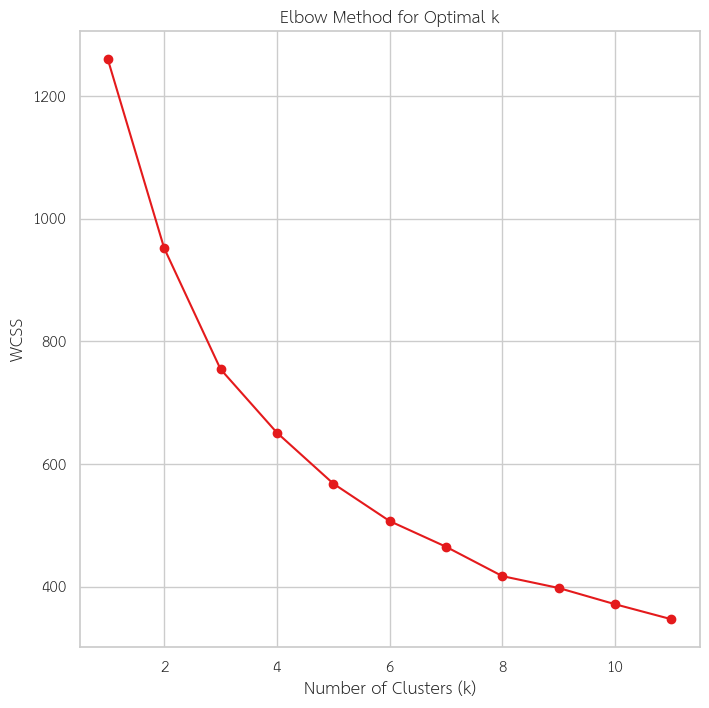

In [ ]:
from sklearn.cluster import KMeans

x = scale_data_for_cluster[col_list_seg].values
inertia = []
for k in range(1, 12):
    kmeans = KMeans(n_clusters=k, n_init=6 ,random_state=0)
    kmeans.fit(scale_data_for_cluster)
    inertia.append(kmeans.inertia_)
    plt.figure(figsize=(8, 8))
plt.plot(range(1, 12), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.show()

### 🔰Evaluate Clustering with silhouette score

silhouette score for 2 Cluster: 0.2225
silhouette score for 3 Cluster: 0.2542
silhouette score for 4 Cluster: 0.2361
silhouette score for 5 Cluster: 0.2593
silhouette score for 6 Cluster: 0.2563
silhouette score for 7 Cluster: 0.2605


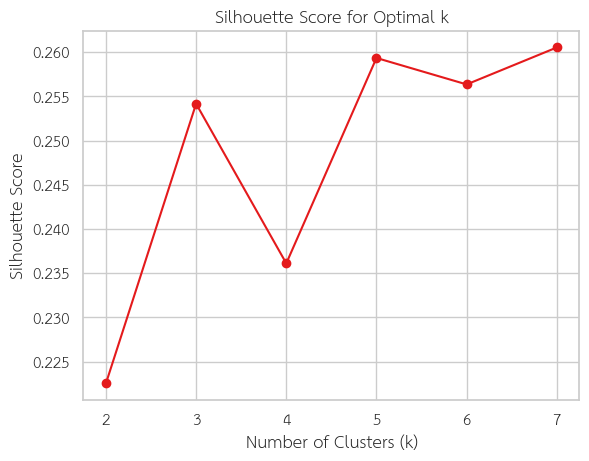

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
krange = list(range(2,8))

for k in krange:
    kmeans = KMeans(n_clusters=k, random_state=0)
    clusters = kmeans.fit_predict(scale_data_for_cluster)
    silhouette_avg = silhouette_score(scale_data_for_cluster, clusters)
    silhouette_scores.append(silhouette_avg)
    print('silhouette score for %i Cluster: %0.4f' % (k, silhouette_avg))


plt.plot(krange, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal k')
plt.show()


## According to the elbow method and the silhouette score we will choose K = 3, Since it earn a good score for silhouette and the elbow point is appear to be at 3 so we may segment customer in 3 group

###  🍅Kmeans Clustering with N cluster

In [ ]:
scale_data_for_cluster.head()

,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee
0,-1.363323,1.45998,-1.202206,-0.024233
1,0.922141,-1.39965,-1.202206,-0.024233
2,-0.220591,-1.39965,-1.202206,-0.024233
3,-0.220591,-0.44644,1.302610,0.932970
4,-0.220591,-0.44644,-0.367267,0.932970


In [ ]:
from sklearn import cluster

cluster3 = cluster.KMeans(n_clusters= 3, random_state = 15)
cluster3.fit(scale_data_for_cluster)

KMeans(n_clusters=3, random_state=15)

In [ ]:
cluster3.cluster_centers_

array([[ 0.11233125, -0.13871094, -0.84719252,  0.51843315],
       [-0.71538187, -0.47592093,  0.1147591 , -1.08011643],
       [ 0.59919535,  0.6932676 ,  1.04849802,  0.42315526]])

In [ ]:
cluster = cluster3.labels_ + 1 # change from cluster name 0-3 to 1-4
cluster

array([1, 1, 1, 3, 1, 1, 3, 1, 1, 1, 3, 1, 2, 3, 3, 1, 3, 3, 1, 3, 1, 1,
       1, 3, 1, 3, 1, 2, 2, 1, 2, 3, 3, 1, 2, 1, 3, 1, 2, 3, 1, 1, 3, 1,
       2, 2, 3, 1, 3, 1, 2, 3, 1, 1, 1, 3, 2, 2, 3, 2, 1, 1, 2, 1, 2, 3,
       3, 3, 1, 2, 1, 2, 1, 1, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       1, 2, 1, 1, 1, 2, 2, 1, 2, 2, 1, 3, 1, 2, 1, 3, 1, 2, 2, 1, 1, 2,
       1, 2, 2, 3, 3, 3, 3, 2, 3, 1, 2, 2, 1, 2, 1, 2, 1, 3, 1, 2, 3, 2,
       2, 2, 2, 1, 3, 2, 1, 3, 2, 3, 2, 3, 3, 1, 3, 1, 3, 1, 2, 3, 2, 1,
       3, 2, 1, 1, 1, 3, 1, 1, 1, 2, 3, 2, 3, 2, 1, 3, 2, 3, 3, 2, 2, 3,
       3, 1, 3, 2, 3, 2, 2, 3, 3, 2, 2, 1, 3, 3, 2, 1, 2, 2, 2, 2, 3, 3,
       2, 1, 2, 3, 3, 1, 1, 3, 1, 3, 1, 1, 3, 1, 3, 2, 1, 2, 2, 1, 3, 3,
       1, 1, 3, 1, 1, 3, 2, 1, 1, 3, 2, 1, 2, 2, 3, 3, 2, 3, 1, 3, 1, 1,
       3, 2, 1, 2, 1, 1, 2, 3, 3, 1, 3, 2, 1, 1, 1, 1, 2, 2, 1, 2, 1, 2,
       1, 1, 1, 3, 1, 2, 2, 3, 1, 1, 1, 2, 3, 2, 1, 1, 3, 2, 3, 1, 3, 3,
       3, 2, 1, 1, 1, 1, 3, 1, 1, 1, 3, 1, 1, 3, 1,

In [ ]:
scale_data_for_cluster["cluster"] = cluster

In [ ]:
scale_data_for_cluster.head(5)

,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee,cluster
0,-1.363323,1.45998,-1.202206,-0.024233,1
1,0.922141,-1.39965,-1.202206,-0.024233,1
2,-0.220591,-1.39965,-1.202206,-0.024233,1
3,-0.220591,-0.44644,1.302610,0.932970,3
4,-0.220591,-0.44644,-0.367267,0.932970,1


In [ ]:
scale_data_for_cluster.groupby("cluster").mean()

,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee
cluster,,,,
1,0.112331,-0.138711,-0.847193,0.518433
2,-0.715382,-0.475921,0.114759,-1.080116
3,0.599195,0.693268,1.048498,0.423155


### Evaluate with the original data


In [ ]:
eval_data_to_concat_cluster["cluster"] = cluster

In [ ]:
eval_data_to_concat_cluster.head(5)

,Gender,Age,Occupation,Coffee_type,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee,How_you_drink,Suitable_price_range,Time_drink_coffee,Home_drink,Cups_coffee_taken,Why_no_coffee,Where_having_coffee,First_priority,Second,Third_priority,Fourth_priority,Captital_coffee,interest_jp_coffee,Yes_reason,No_reason,Monthly_income,cluster
0,Male,50~59,พนักงานบริษัท,Hot,3.0,5.0,1.0,4.0,ไม่ใส่อะไรเพิ่ม,50~100บาท,เวลาทำงาน,กาแฟ,มากกว่านั้น,วิธีการทำยุ่งยาก เหนื่อยล้าที่จะทำ,ที่ทำงาน,รสชาติ,สถานทีผลิต,ความง่ายในการชง,ราคาถูก,100~120บาท,ไม่,เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง,เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,49000~,1
1,Female,20~29,นักเรียน/นักศึกษา,Cold,5.0,2.0,1.0,4.0,ใส่เครื่องดื่มรสหวานๆเพิ่ม,50~100บาท,ทานกับขนมหวาน,น้ำผลไม้,0,ไม่มีเหตุผลที่จะซื้อ,ที่ทำงาน,รสชาติ,ราคาถูก,ความง่ายในการชง,สถานทีผลิต,40~60บาท,ใช่,เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง,เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,~15000 บาท,1
2,Female,20~29,นักเรียน/นักศึกษา,Cold,4.0,2.0,1.0,4.0,ใส่นมเพิ่ม,100~150บาท,เวลาทำงาน,ชา,1~2,วิธีการทำยุ่งยาก เหนื่อยล้าที่จะทำ,ที่ทำงาน,รสชาติ,ราคาถูก,สถานทีผลิต,ความง่ายในการชง,140~160บาท,ไม่,เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง,เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,~15000 บาท,1
3,Male,20~29,พนักงานบริษัท,Cold,4.0,3.0,4.0,5.0,ใส่น้ำตาลหรือน้ำเชื่อมเพิ่ม,50~100บาท,"หลังจากตื่นนอน, ก่อนเข้านอน",ชา,1~2,วิธีการทำยุ่งยาก เหนื่อยล้าที่จะทำ,"บ้าน, คาเฟ่, แผงลอยข้างถนน, ที่ทำงาน",ราคาถูก,รสชาติ,สถานทีผลิต,ความง่ายในการชง,40~60บาท,ไม่,เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง,เพราะราคาดูแพงเกินไป,21000~23000,3
4,Male,20~29,นักเรียน/นักศึกษา,Both,4.0,3.0,2.0,5.0,ใส่นมเพิ่ม,100~150บาท,"เวลาทำงาน, ทานกับขนมหวาน","กาแฟ, ชา, น้ำผลไม้, เครื่องดื่มแอลกอฮอล์",1~2,วิธีการทำยุ่งยาก เหนื่อยล้าที่จะทำ,"บ้าน, คาเฟ่, ที่ทำงาน",รสชาติ,สถานทีผลิต,ราคาถูก,ความง่ายในการชง,120~140บาท,ใช่,"เพราะรู้สึกว่าคุณภาพและความปลอดภัยของผลิตภัณฑ์สูง, เพราะชอบภาพลักษณ์ญี่ปุ่นในผลิตภัณฑ์",เพราะกังวลเกี่ยวกับคุณภาพและความปลอดภัย,~15000 บาท,1


In [ ]:
eval_data_to_concat_cluster.groupby('cluster').mean()

,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee
cluster,,,,
1,4.291339,3.322835,1.425197,4.566929
2,3.567010,2.969072,2.577320,2.896907
3,4.717391,4.195652,3.695652,4.467391


In [ ]:
cluster_customer_cluster_1 = eval_data_to_concat_cluster[eval_data_to_concat_cluster['cluster']== 1]
cluster_customer_cluster_2 = eval_data_to_concat_cluster[eval_data_to_concat_cluster['cluster']== 2]
cluster_customer_cluster_3 = eval_data_to_concat_cluster[eval_data_to_concat_cluster['cluster']== 3]


In [ ]:
col_list_no_cluster = ['Gender',
 'Age',
 'Occupation',
 'Coffee_type',
 'Chance_and_coffee_trend',
 'level_of_roasted',
 'Level_of_acidity',
 'Smell_of_coffee',
 'How_you_drink',
 'Suitable_price_range',
 'Time_drink_coffee',
 'Home_drink',
 'Cups_coffee_taken',
 'Why_no_coffee',
 'Where_having_coffee',
 'First_priority',
 'Second',
 'Third_priority',
 'Fourth_priority',
 'Captital_coffee',
 'interest_jp_coffee',
 'Yes_reason',
 'No_reason',
 'Monthly_income']

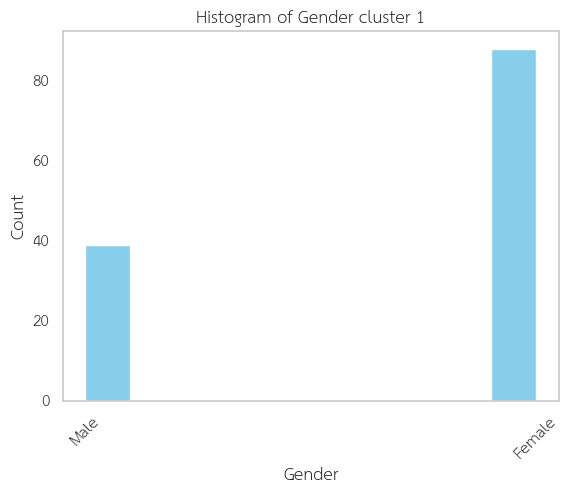

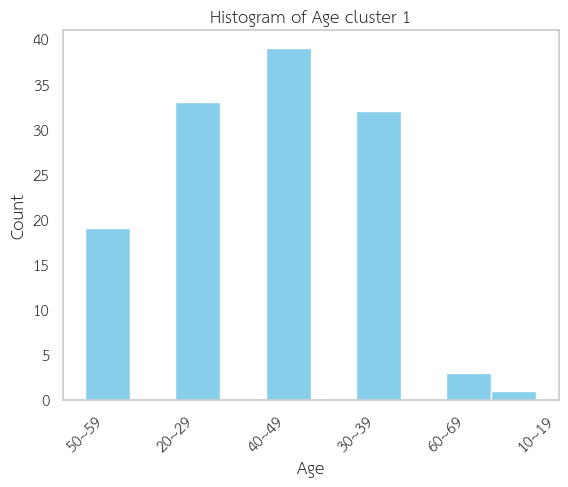

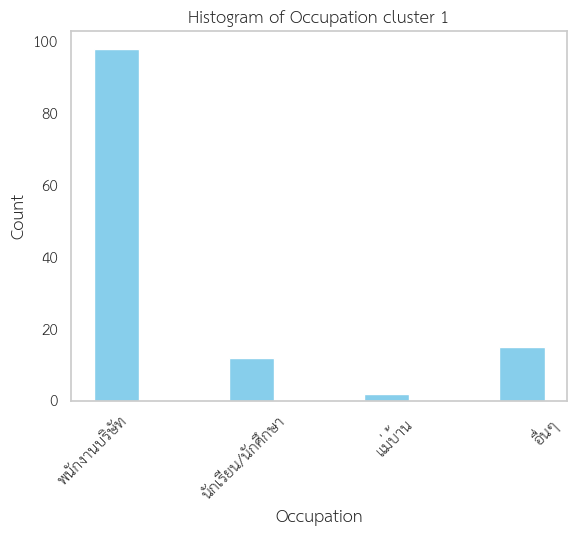

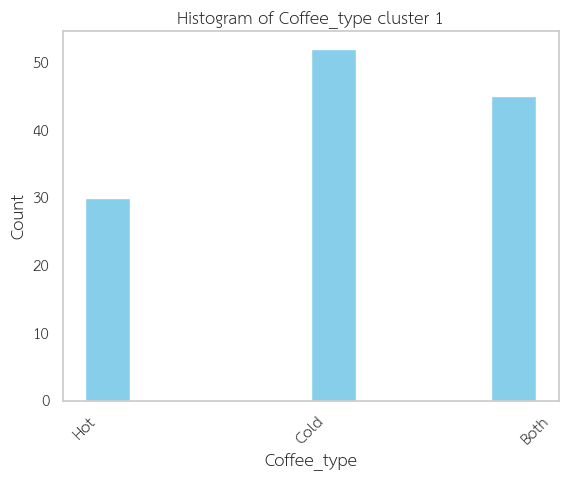

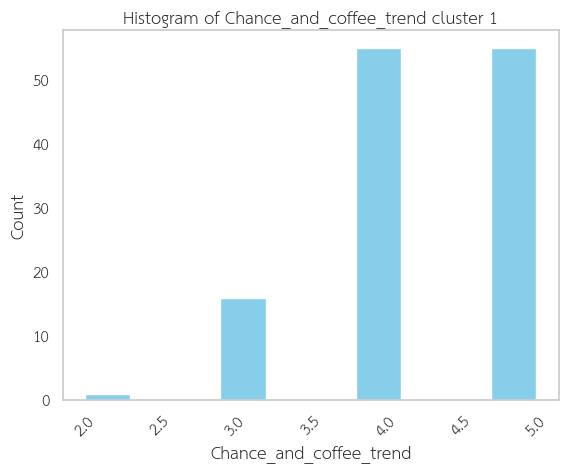

...

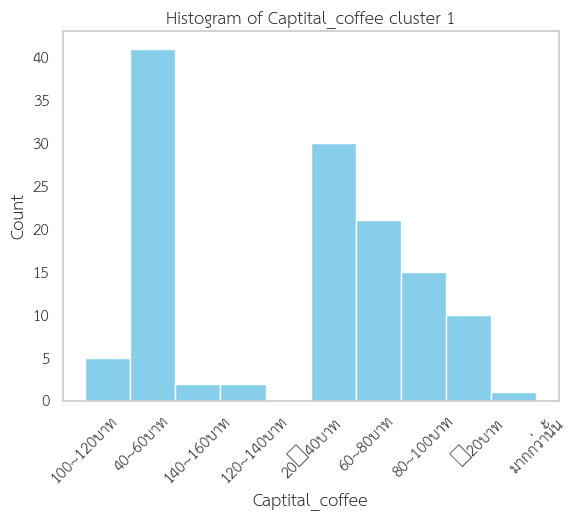

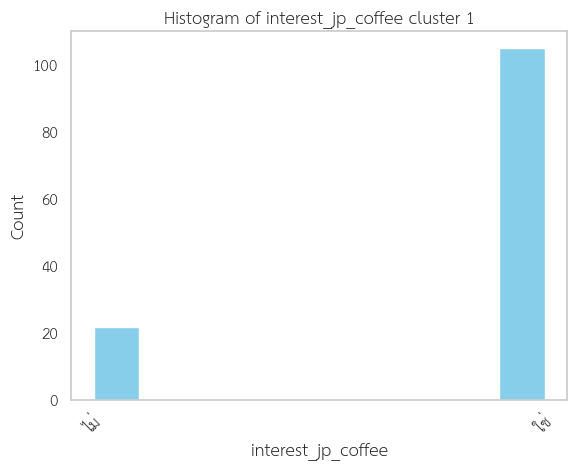

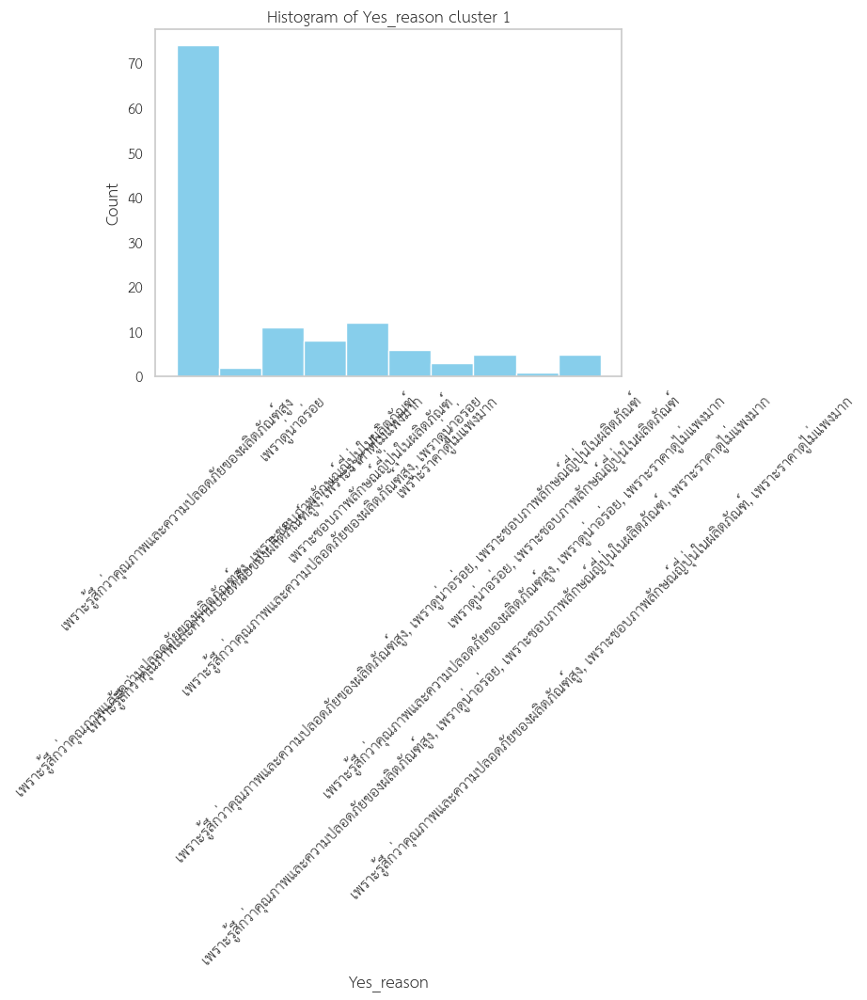

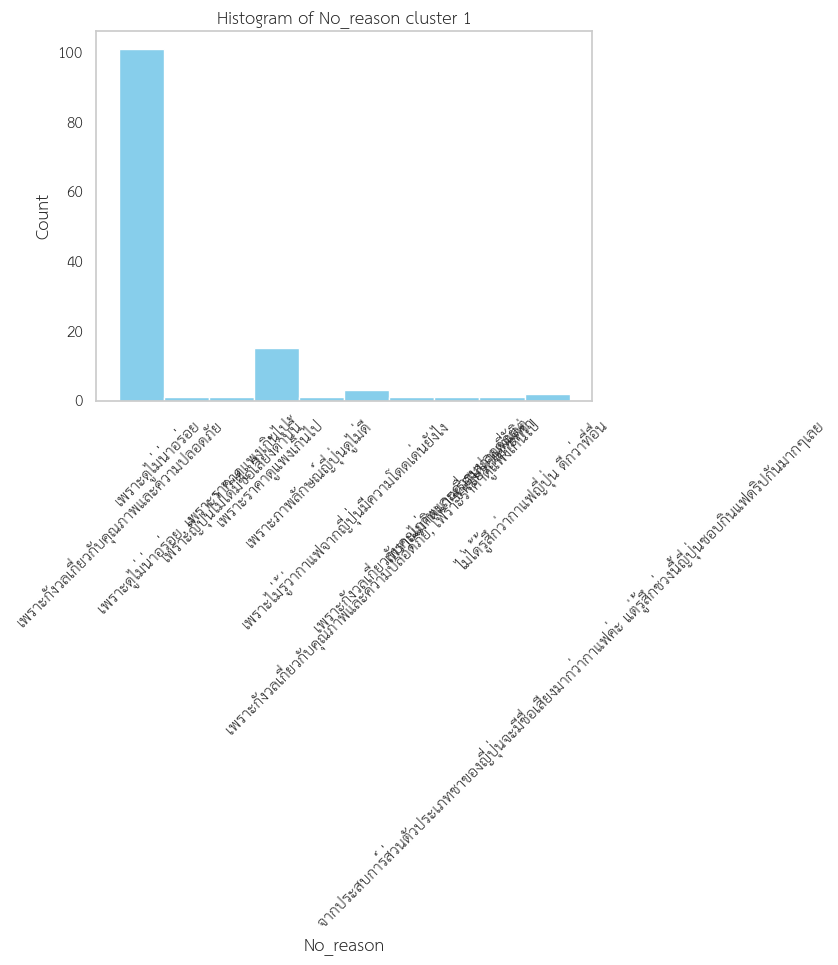

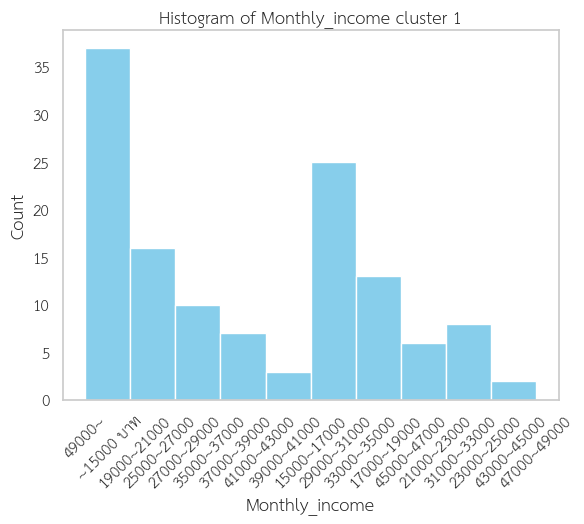

In [ ]:
for column in col_list_no_cluster:
    cluster_customer_cluster_1[column].hist(color='skyblue')
    plt.title(f'Histogram of {column} cluster 1')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.grid(False)
    plt.show()

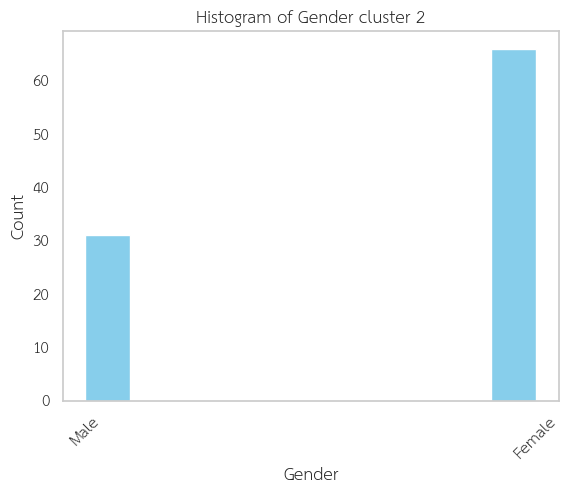

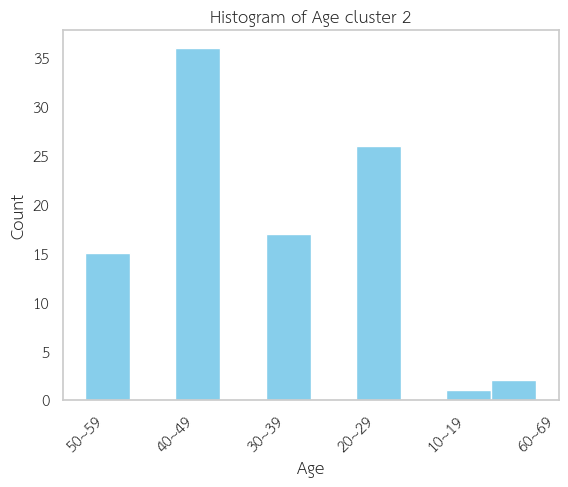

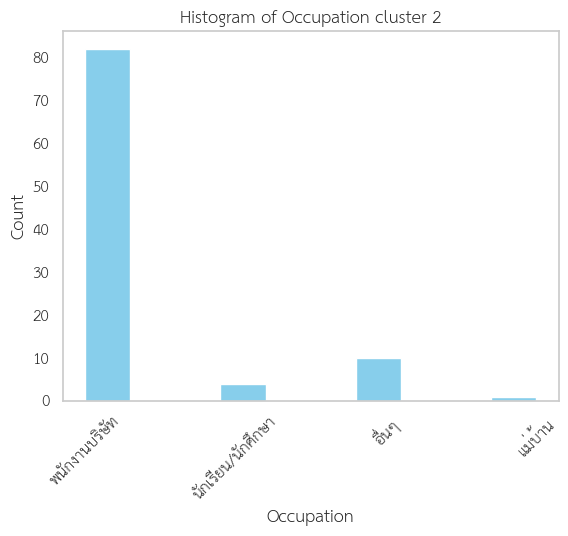

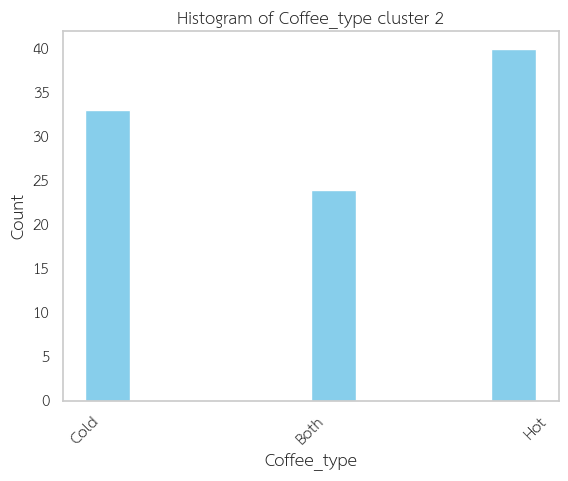

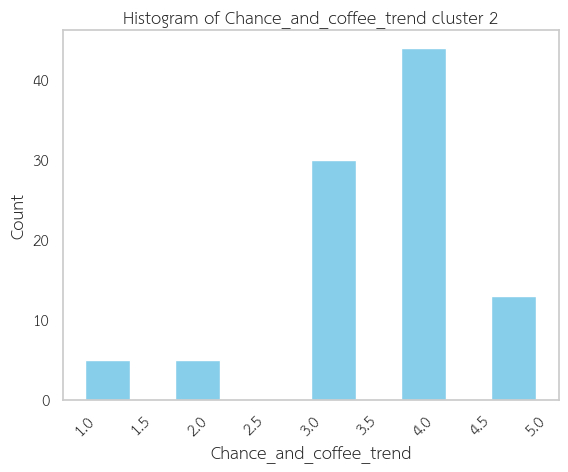

...

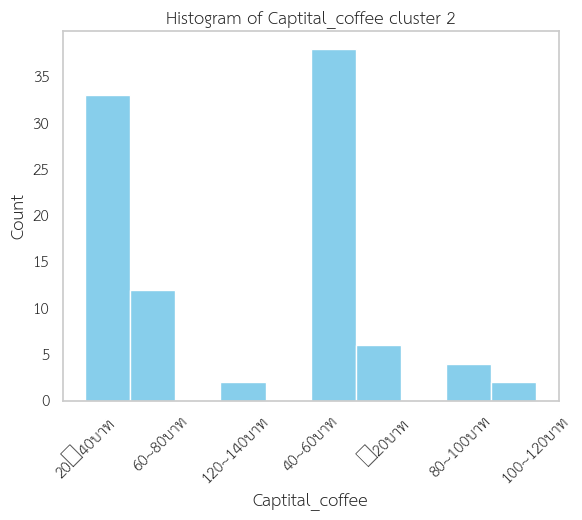

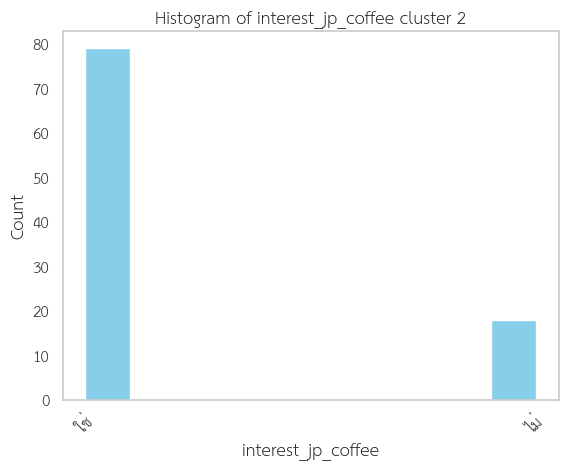

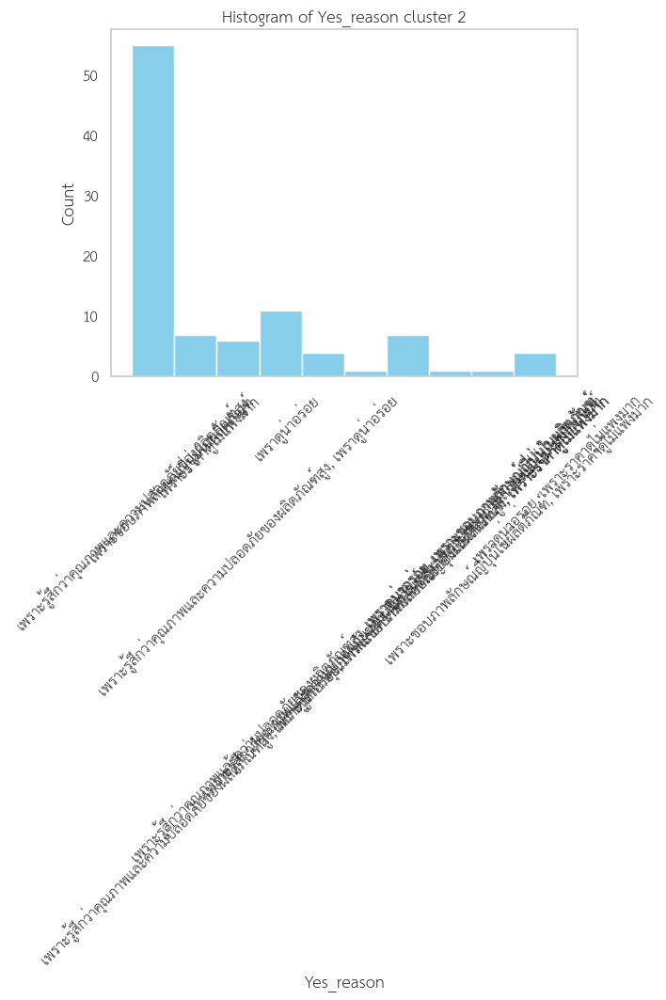

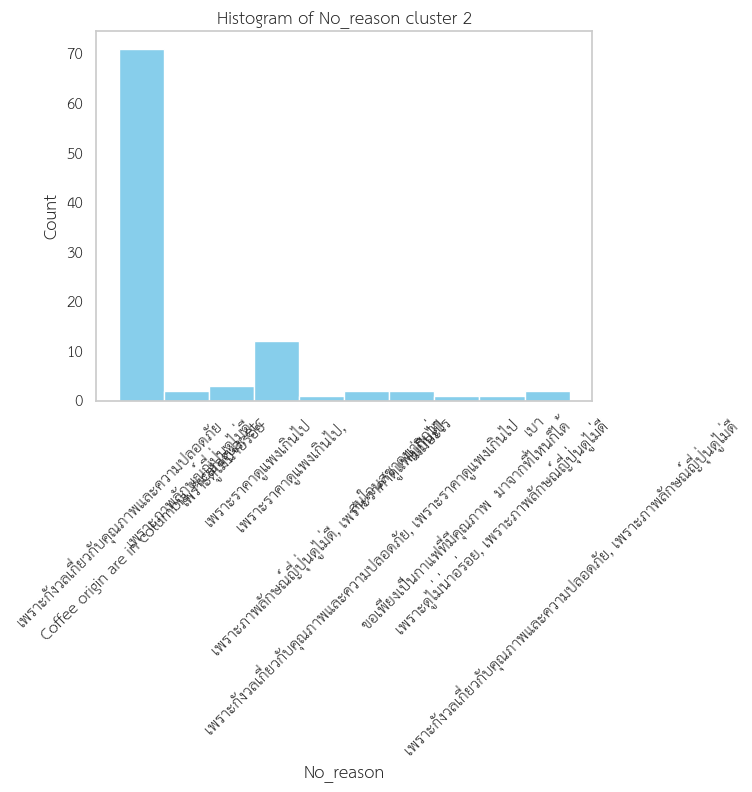

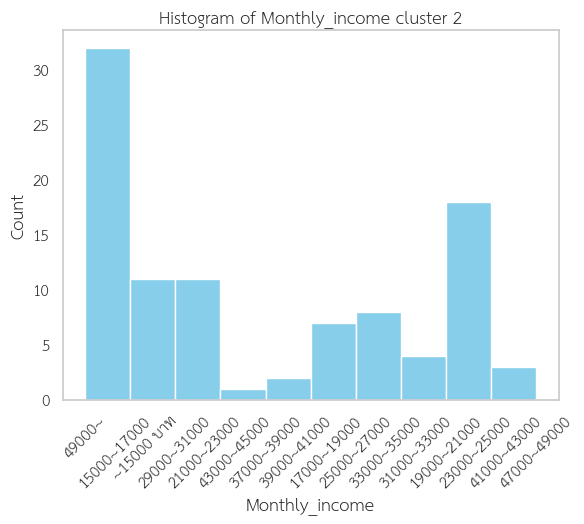

In [ ]:
for column in col_list_no_cluster:
    cluster_customer_cluster_2[column].hist(color='skyblue')
    plt.title(f'Histogram of {column} cluster 2')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.grid(False)
    plt.show()

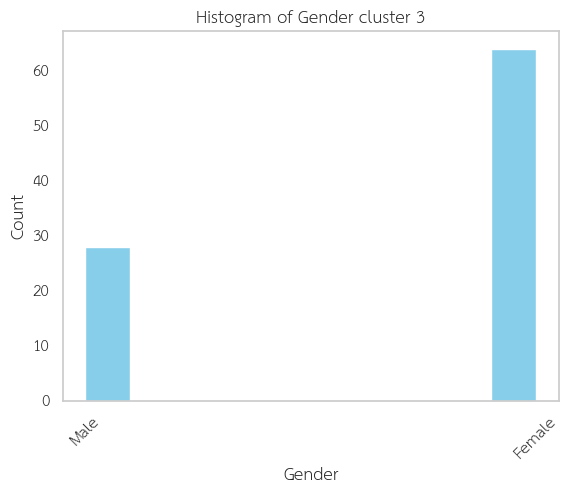

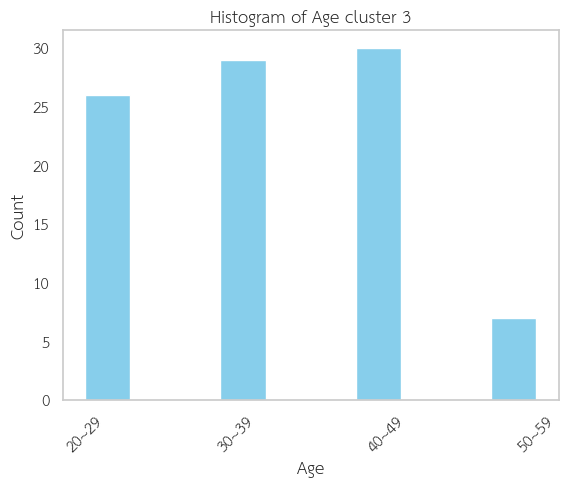

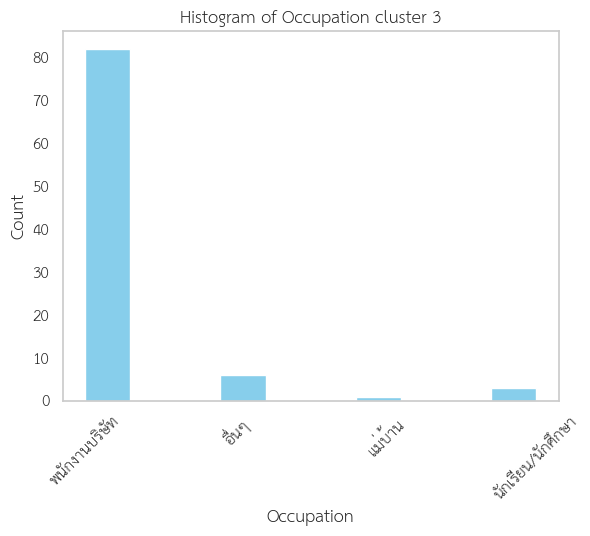

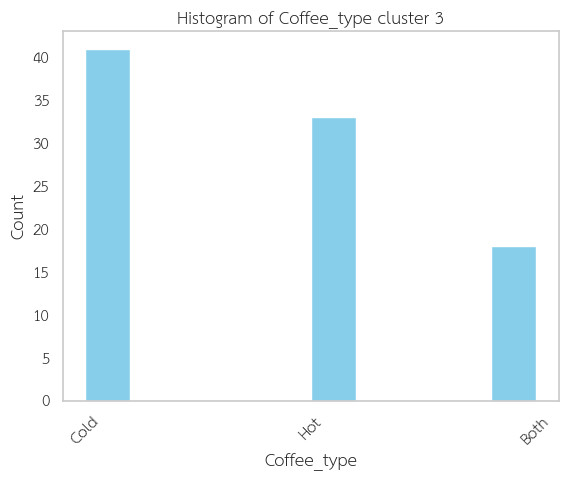

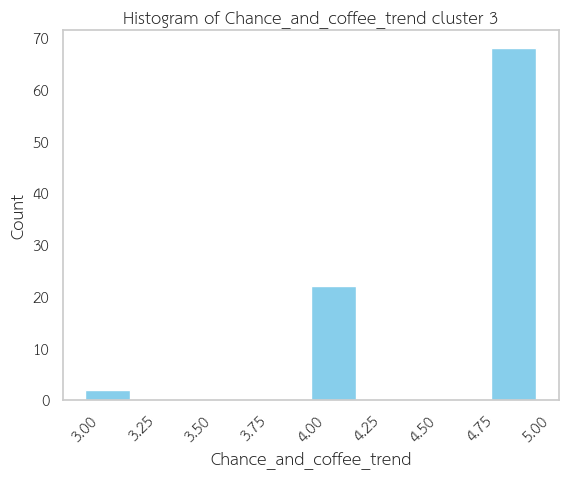

...

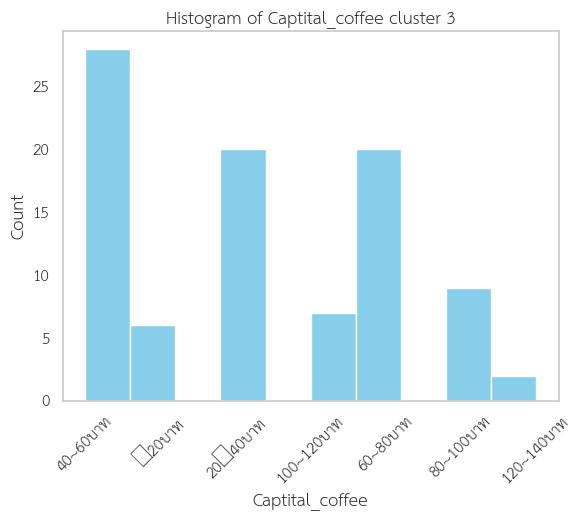

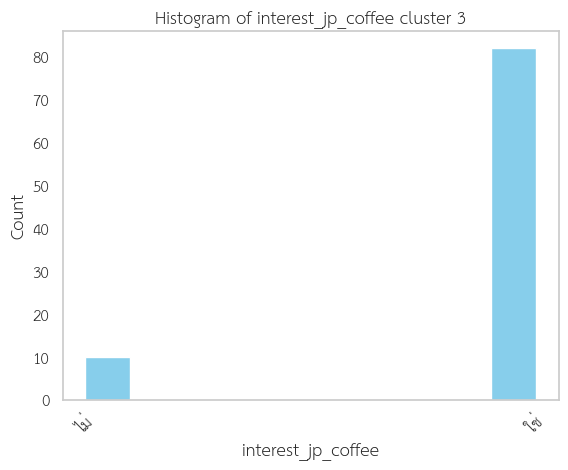

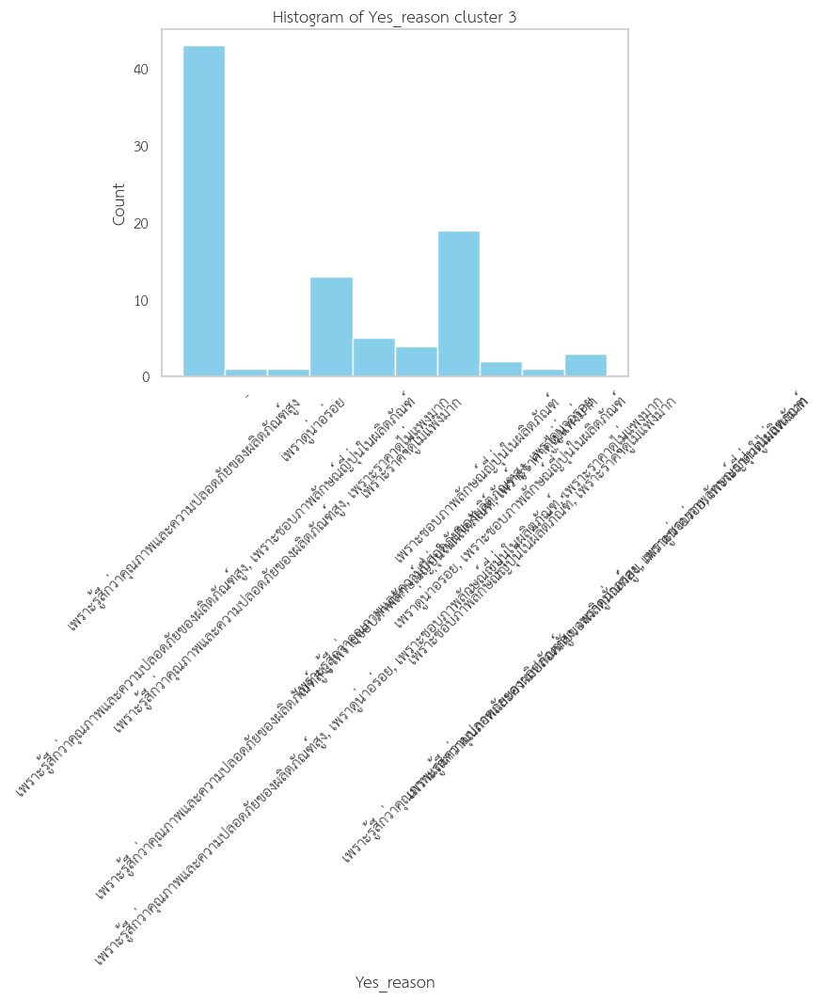

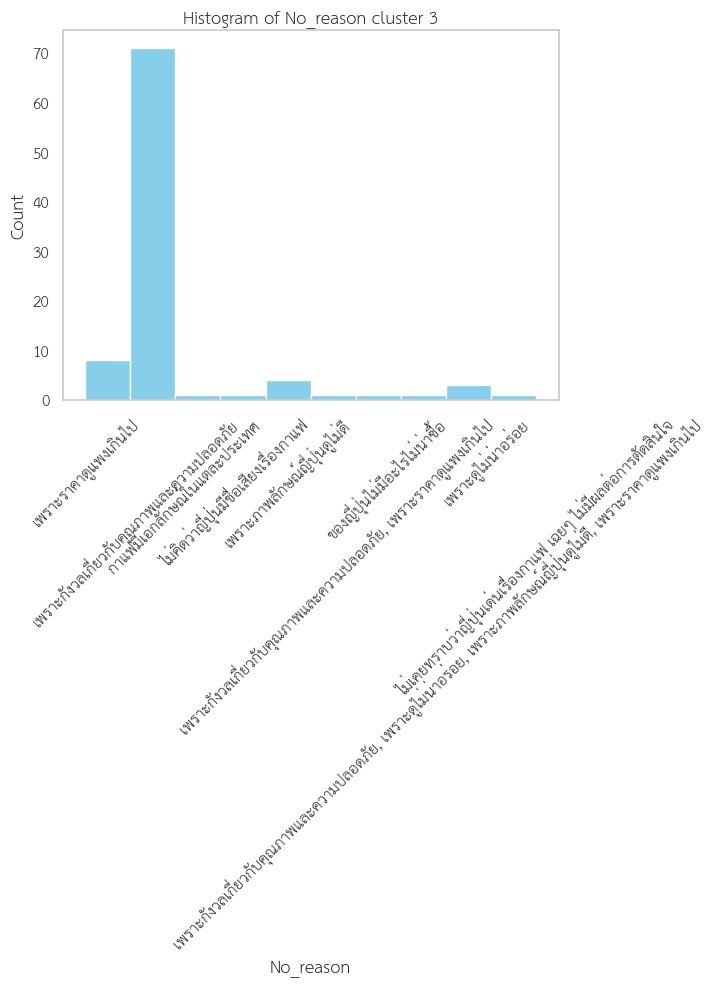

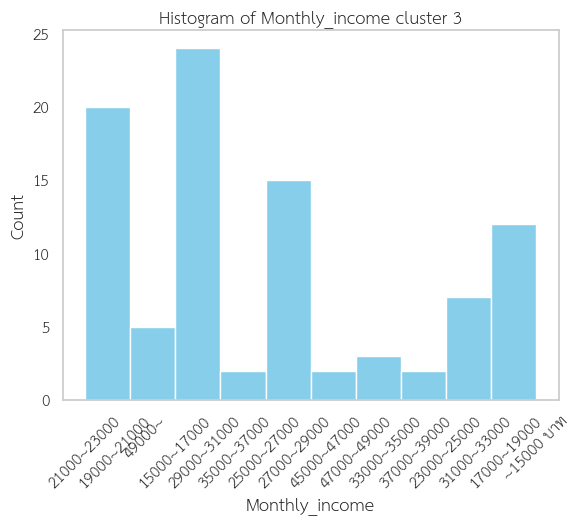

In [ ]:
for column in col_list_no_cluster:
    cluster_customer_cluster_3[column].hist(color='skyblue')
    plt.title(f'Histogram of {column} cluster 3')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.grid(False)
    plt.show()

# ⭐We can cluster the customer as 3 segment
from total observation 316 participant joined our survey

💎Cluster 1  :  likely to buy
this group of customer is the group that also see high change in trend of coffee also. they tend to like medium roast and low level of acidity.However, the smell of coffee also an important feature to attract these group of customer

💎Cluster 2  : less likely to buy
this group of customer is the group that tend to see less chance than customer group 1 and 3 and this group tend to like less medium level of roast and medium level of acidicity and they are neutral to the smell of coffee

💎Cluster 3  : Most likely to buy
this group of customer is the group that see high chance in trend about coffee
they tend to like dark roast coffee and and level of acidity more than average and they love the smell of coffee


The strategies to sell the coffee to gain more sale maybe we can offer a variety level of roasted coffee so they can have choice of level of roast

In [ ]:
scale_data_for_cluster.groupby("cluster").mean()

,Chance_and_coffee_trend,level_of_roasted,Level_of_acidity,Smell_of_coffee
cluster,,,,
1,0.112331,-0.138711,-0.847193,0.518433
2,-0.715382,-0.475921,0.114759,-1.080116
3,0.599195,0.693268,1.048498,0.423155


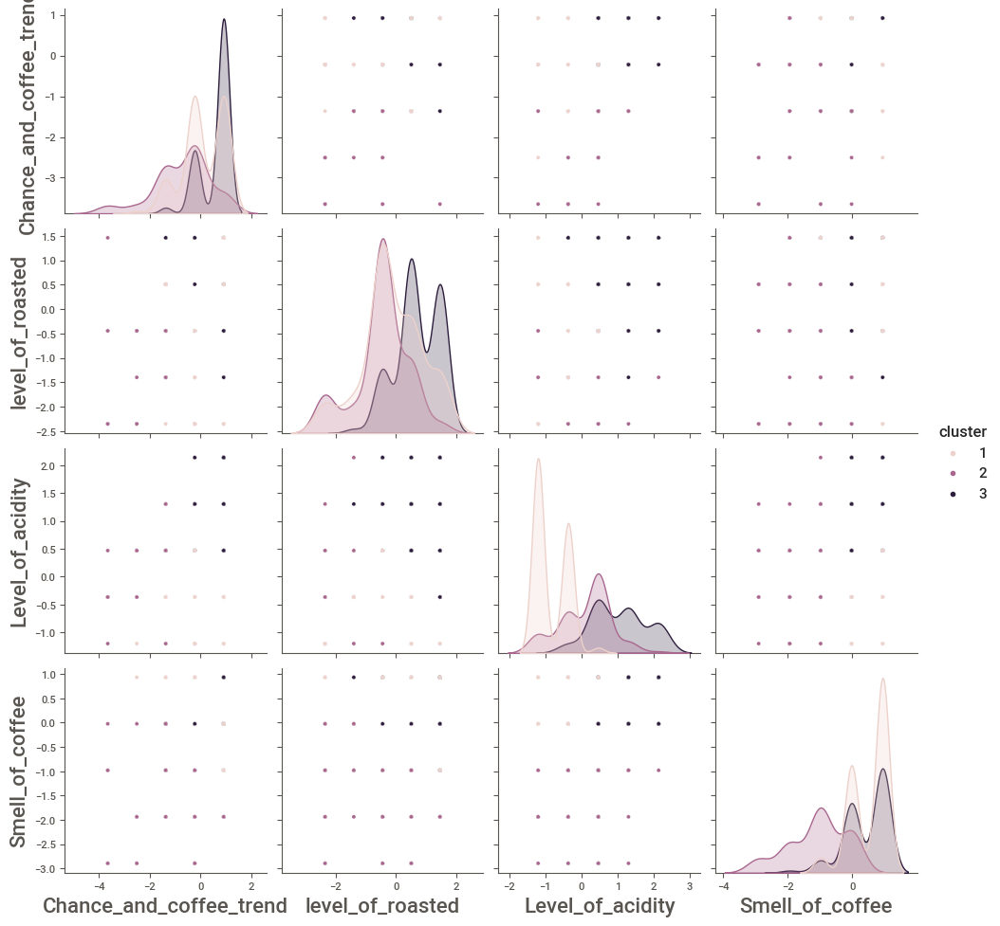

In [ ]:
sns.pairplot(scale_data_for_cluster, hue='cluster')

# ⭐We can cluster the customer as 3 segment
💎Cluster 1  :  กลุ่มที่ชอบ
strategy :

💎Cluster 2  : กลุ่มที่ชอบ
strategy :

💎Cluster 3  : กลุ่มที่
strategy :

In [ ]:
# Assuming 'coffee_drinker_data' is your DataFrame
coffee_drinker_data.to_csv('coffee_drinker_data_cleaned.csv', index=False, encoding='utf-8')
coffee_drinker_data.to_excel('coffee_drinker_data_cleaned.xlsx', index=False, encoding='utf-8')


# Download the CSV file to your local machine
# files.download('coffee_drinker_data.csv')

# Graph visualization

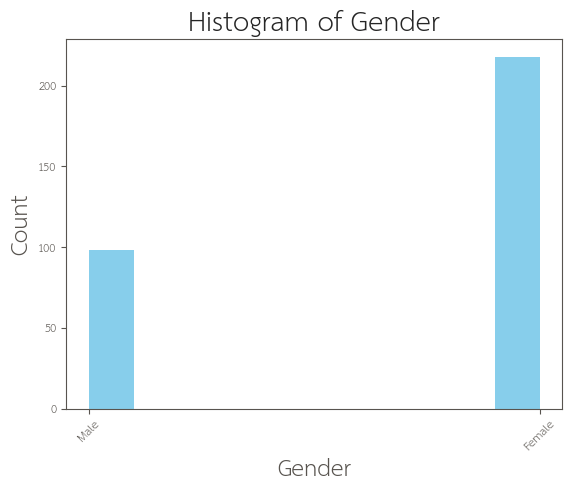

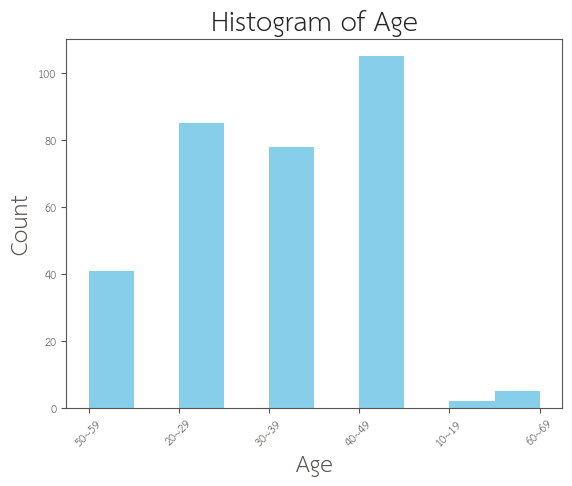

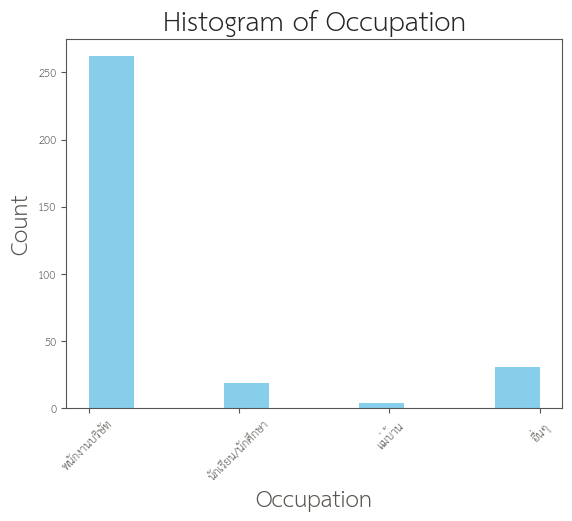

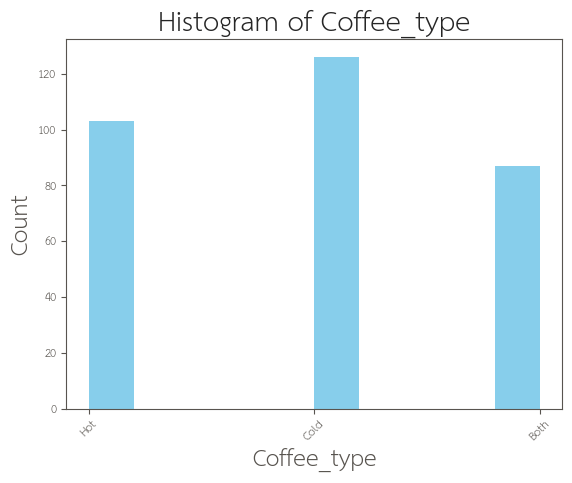

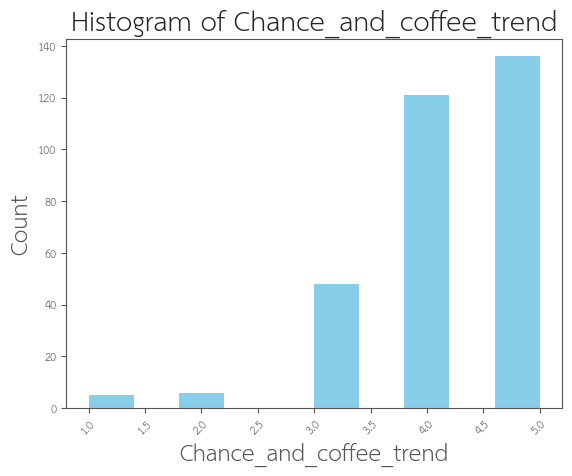

...

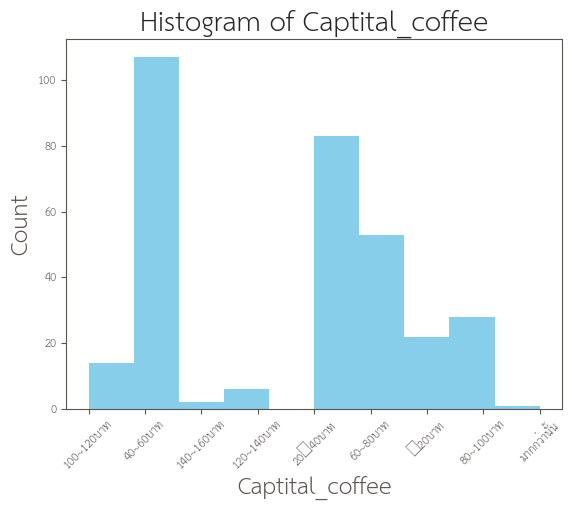

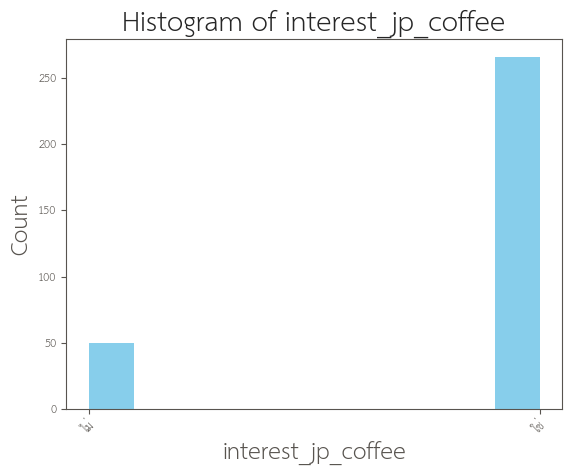

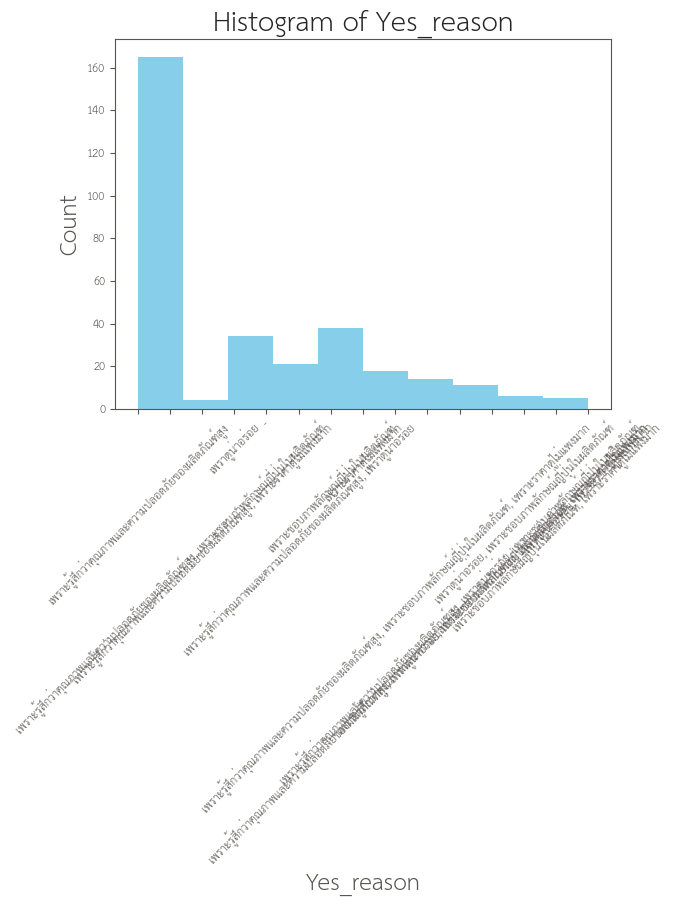

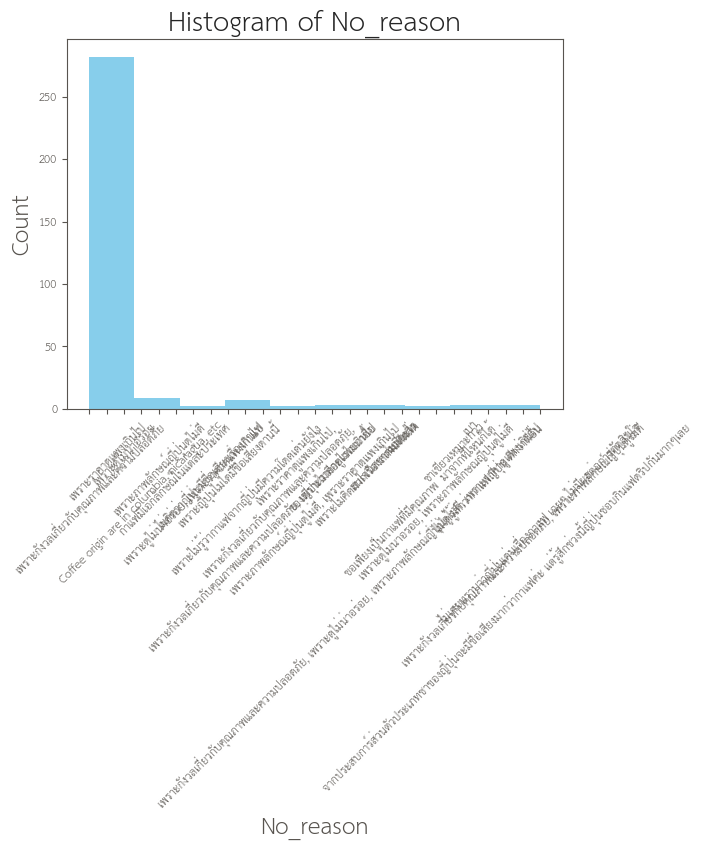

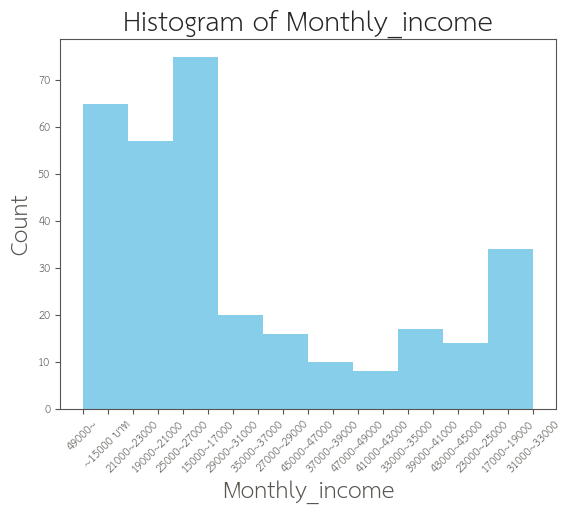

In [ ]:
for column in coffee_drinker_data.columns:
    coffee_drinker_data[column].hist(color='skyblue')
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.grid(False)
    plt.show()


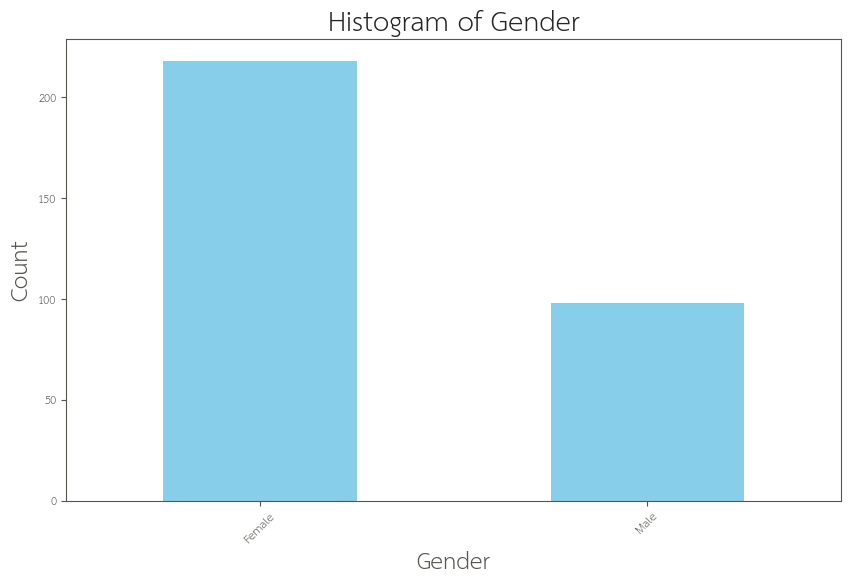

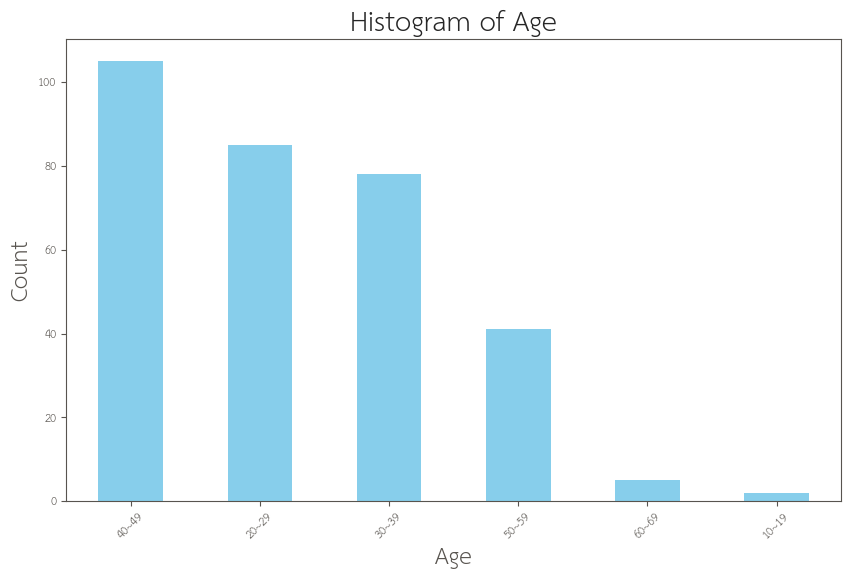

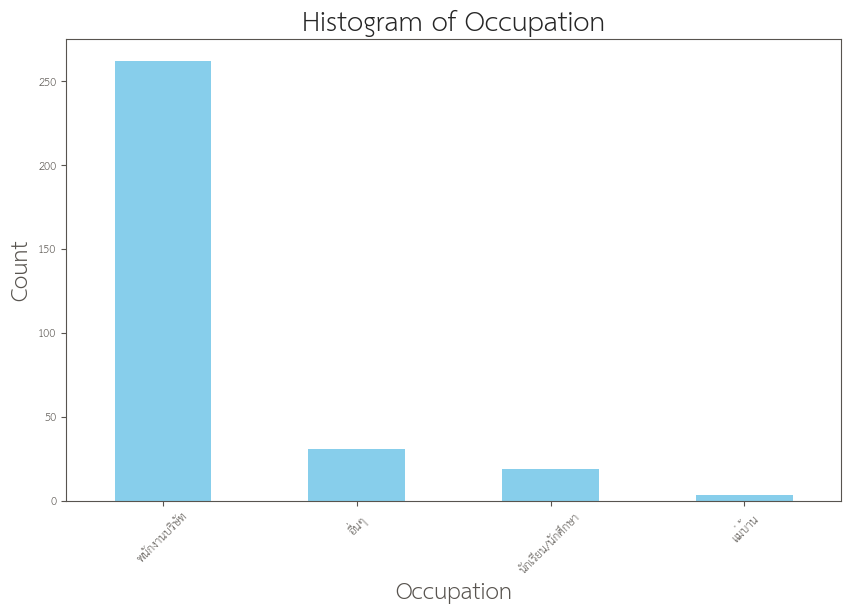

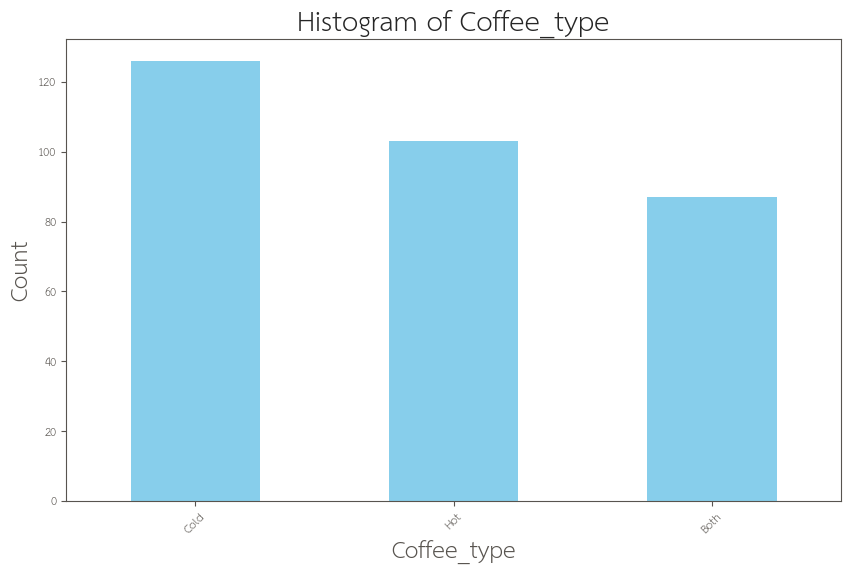

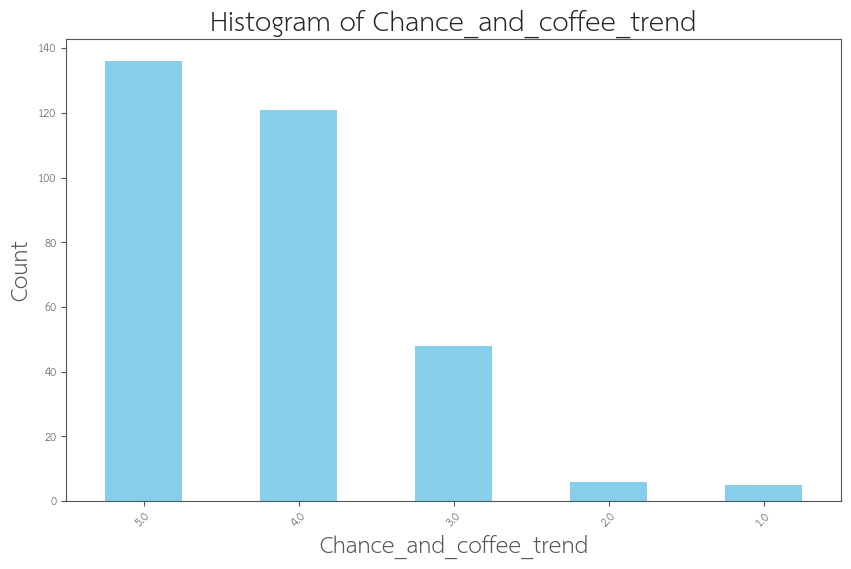

...

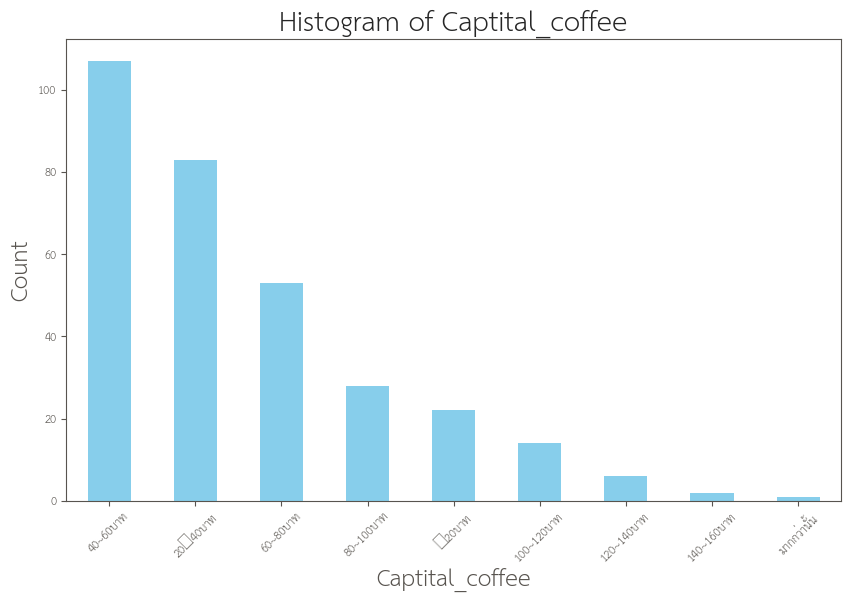

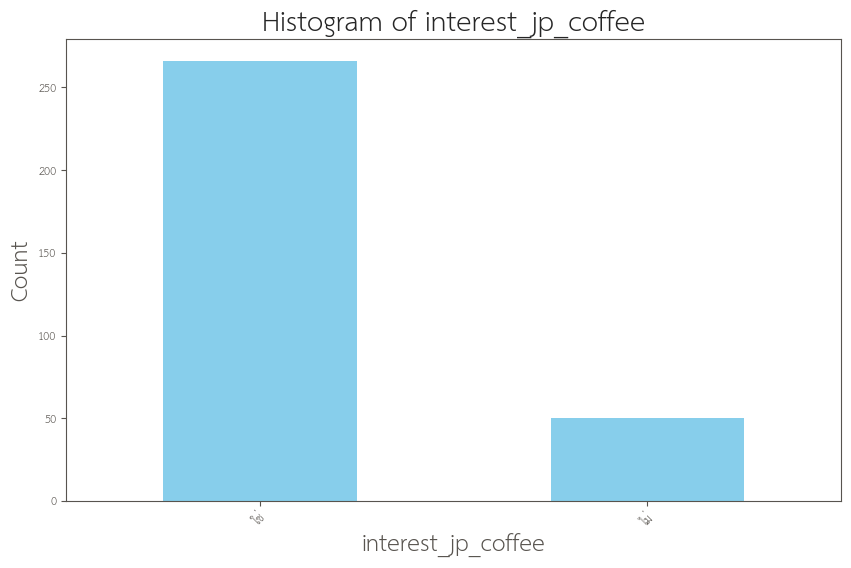

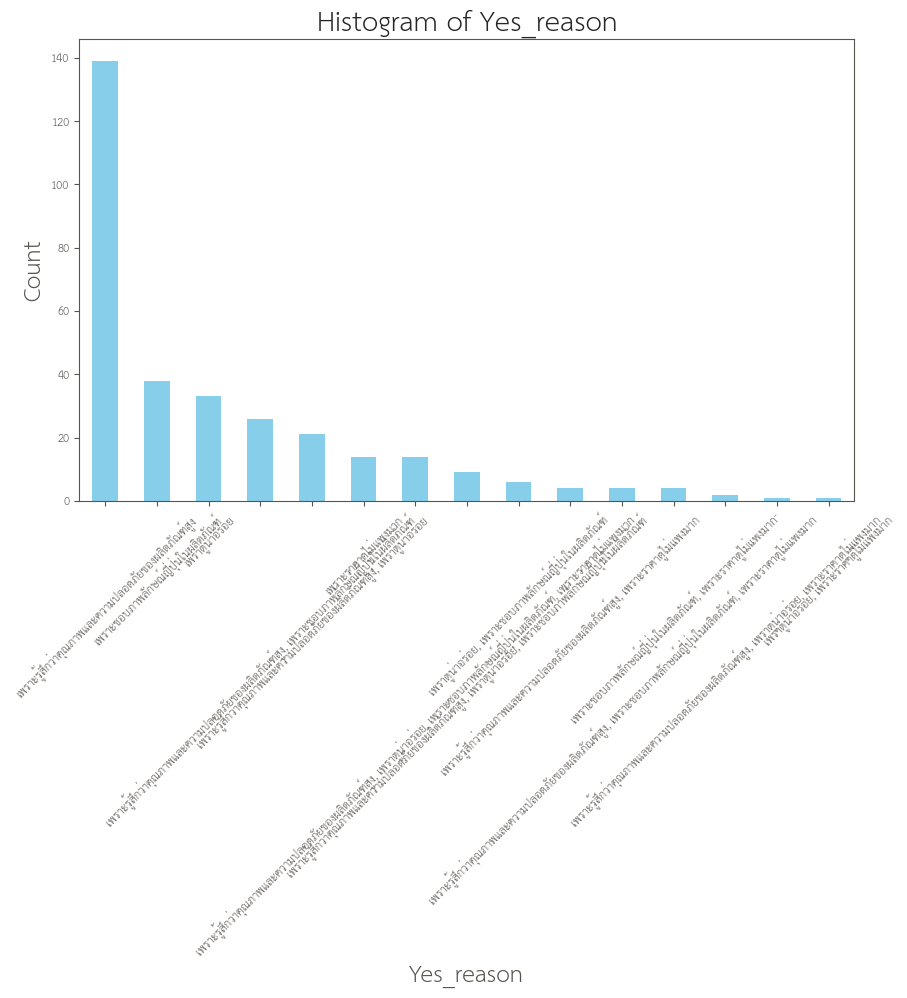

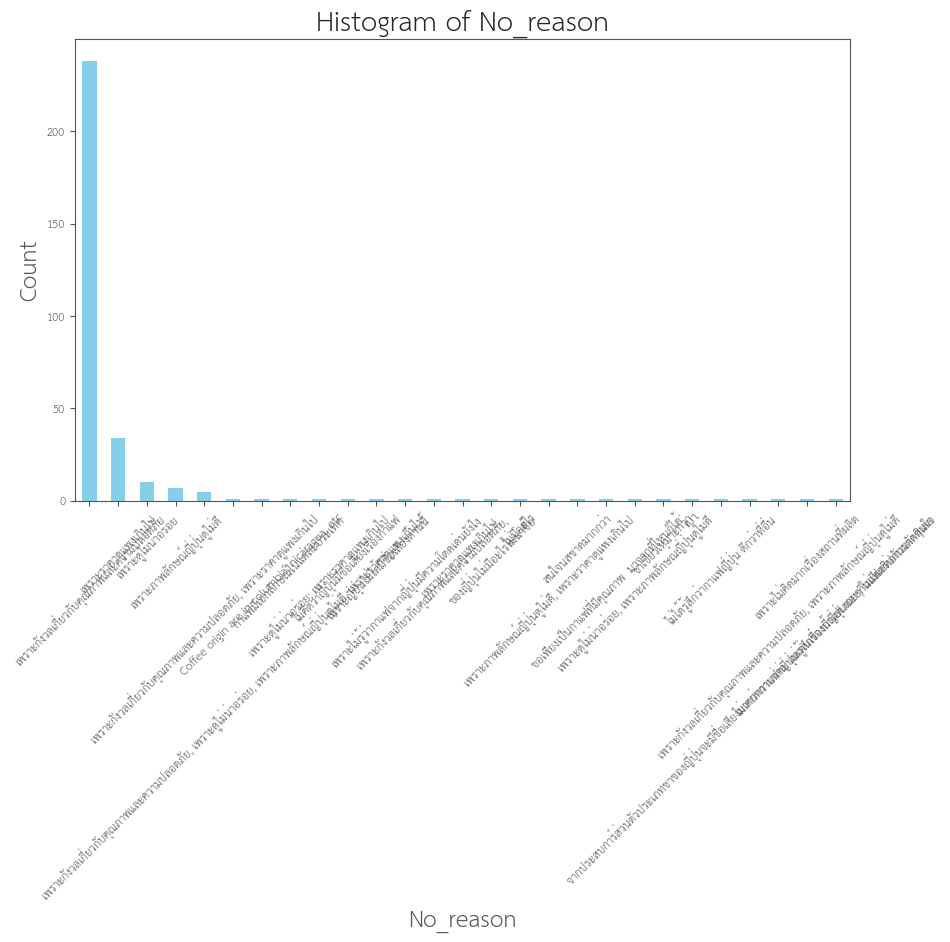

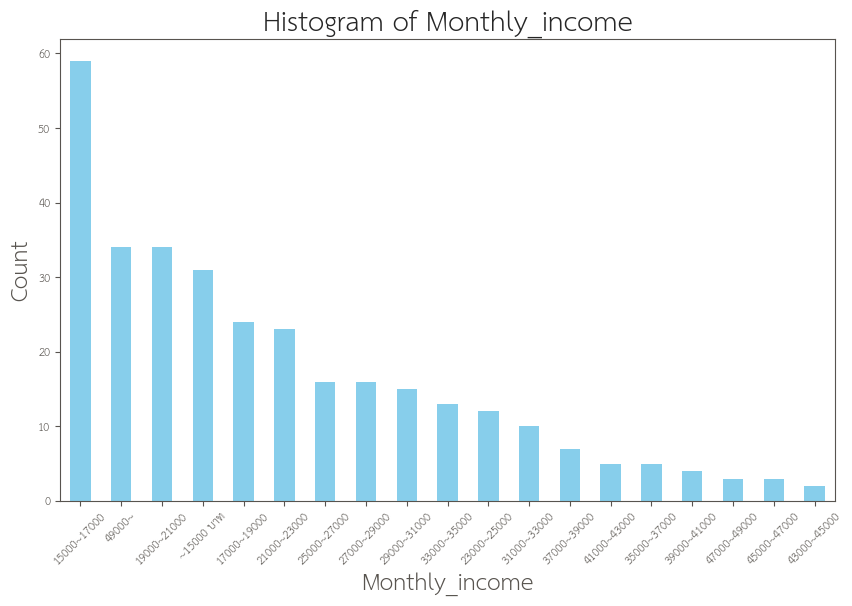

In [ ]:
# Assuming 'coffee_drinker_data' is your DataFrame
for column in coffee_drinker_data.columns:
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed

    # Get the counts of each unique value and sort in descending order
    value_counts = coffee_drinker_data[column].value_counts().sort_values(ascending=False)

    # Plot the histogram with bars sorted by count
    value_counts.plot(kind='bar', color='skyblue')

    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.grid(False)
    plt.xticks(rotation=45)
    plt.savefig(f'{column}_histogram.jpg', format='jpeg', bbox_inches='tight')
    plt.show()


# 📊OLS Analysis
Ordinary least square

In [ ]:
coffee_drinker_data.columns.tolist()

['Gender',
 'Age',
 'Occupation',
 'Coffee_type',
 'Chance_and_coffee_trend',
 'level_of_roasted',
 'Level_of_acidity',
 'Smell_of_coffee',
 'How_you_drink',
 'Suitable_price_range',
 'Time_drink_coffee',
 'Home_drink',
 'Cups_coffee_taken',
 'Why_no_coffee',
 'Where_having_coffee',
 'First_priority',
 'Second',
 'Third_priority',
 'Fourth_priority',
 'Captital_coffee',
 'interest_jp_coffee',
 'Yes_reason',
 'No_reason',
 'Monthly_income']

In [ ]:
encoded_df = pd.get_dummies(coffee_drinker_data, columns=['Gender',
 'Age',
 'Occupation',
 'Coffee_type',
 'How_you_drink',
 'Suitable_price_range',
 'Time_drink_coffee',
 'Home_drink',
 'Cups_coffee_taken',
 'Why_no_coffee',
 'Where_having_coffee',
 'First_priority',
 'Second',
 'Third_priority',
 'Fourth_priority',
 'Captital_coffee',
 'interest_jp_coffee',
 'Yes_reason',
 'No_reason',
 'Monthly_income'], drop_first=True)

In [ ]:
numerical_df = coffee_drinker_data['Chance_and_coffee_trend',
 'level_of_roasted',
 'Level_of_acidity',
 'Smell_of_coffee']

In [ ]:
combined_df = pd.concat([numerical_df, encoded_df], axis=1)

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize the standard scaler
scaler = StandardScaler()

# Standardize the combined data
standardized_df = scaler.fit_transform(combined_df)

In [ ]:
import statsmodels.api as sm

# Load the survey data into a DataFrame
survey_data = pd.read_csv('coffee_survey_data.csv')

# Data preparation and feature selection (e.g., encoding categorical variables)

# Define the target variable and features
X = survey_data[['Gender', 'Age_Group', 'Likert_Scale_Variables']]
y = survey_data['Purchase_Intention']

# Add intercept term
X = sm.add_constant(X)

# Fit OLS regression model
model = sm.OLS(y, X).fit()

# Print model summary
print(model.summary())

# 📊Kruskal wallis-test